# **<font color = green> <center> Housing Price Prediction </center>**

##### <font color = orange>Submission By:
- Vinodh Nagarajaiah

## <strong><font color = #FF6666> <u> About the Case Study </u> </strong></font>

   <font color = #FF0099> A US-based housing company named  <strong> Surprise Housing </strong> has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.


The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

## <strong><font color = #FF6666> <u> Business Objective of the Case Study </u> </strong></font>
<font color = #FF0099> You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market. <font>

## <strong><font color = #FF6666> <u> Expectations From the Case Study </u> </strong></font>
The company wants to know:

Which variables are significant in predicting the price of a house, and

How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression.

## <font color = orange> <strong> <center> <u> DATA UNDERSTANDING </u> </center> </strong> </font>

In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

from colorama import Fore, Back, Style

import statsmodels.api as sm

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import Ridge, Lasso

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import r2_score, mean_squared_error

from sklearn.metrics import r2_score, mean_squared_error

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

## Suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
## Set display limits
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format = "{:,.2f}".format

In [3]:
# Utility functions to plot pie chart for data-types in the dataset

def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def plot_datatype_pie_chart(dataframe):
    type_to_columns_dict = dataframe.columns.to_series().groupby(dataframe.dtypes).groups
    types_list = list(type_to_columns_dict.keys())

    type_to_fdCount_dict = dict.fromkeys(types_list)
    for key in types_list:
        type_to_fdCount_dict.update({key:len(type_to_columns_dict[key])})

    df = pd.DataFrame(type_to_fdCount_dict,index=['count']).transpose()
    explode_values = list()
    explode_values.append(0)
    for i in range(1,len(df)):
        explode_values.append(explode_values[i-1]+0.1)

    df.plot.pie(y='count',legend=False, figsize=(4, 4),autopct= autopct_format(df["count"]),
                explode=explode_values, shadow=True, startangle=0)
    plt.title("Datatype distribution for the dataset - {}".format(dataframe.attrs["name"]))
    plt.show()
    
    
# Utility function to attach a 'name' attribute tot he dataframe. Acts like metadata
def add_attribute(dataframe,attrKey,attrValue):
    dataframe.attrs[attrKey] = attrValue
    
# Utilitu method to plot box and displot side-by-side given a dataframe
def dist_box_plot(dataframe):
    for column in dataframe.columns:
        plt.figure(figsize=(15,5))

        plt.subplot(1,2,1)
        plt.title(column, fontdict={'fontsize': 12})
        sns.distplot(dataframe[column])

        plt.subplot(1,2,2)
        sns.boxplot(dataframe[column])
        plt.show()

# Define a function for checking metrics 
def show_metrics(y_train, y_train_pred, y_test, y_pred):
    ''' 
    Takes in the values of true y_train and y_test, and predicted y_train and y_test.
    Prints out 
    1. R-Squared (Train)
    2. R-Squared (Test)
    3. RSS (Train)
    4. RSS (Test)
    5. MSE (Train)
    6. MSE (Test)
    7. RMSE (Train)
    8. RMSE (Test)
    
    Returns a list containing all the above 8 metrics
    
    '''
    
# Create a list to save all metrics (will be used in creating a final summary in the end)
    metric = []
    
    # R-squared of train and test data
    print("R-Squared (Train) =", '%.2f' % r2_score(y_train, y_train_pred))
    metric.append(r2_score(y_train, y_train_pred))
    print("R-Squared (Test) =", '%.2f' % r2_score(y_test, y_pred))
    metric.append(r2_score(y_test, y_pred))
    
    # Residual sum of squares of train and test data
    rss_train = np.sum(np.square(y_train - y_train_pred))
    metric.append(rss_train)
    rss_test = np.sum(np.square(y_test - y_pred))
    metric.append(rss_test)
    print("RSS (Train) =", '%.2f' % rss_train)
    print("RSS (Test) =", '%.2f' % rss_test)
    
    
    # Mean Squared Error of train and test data
    mse_train = mean_squared_error(y_train, y_train_pred)
    metric.append(mse_train)
    mse_test = mean_squared_error(y_test, y_pred)
    metric.append(mse_test)
    print("MSE (Train) =", '%.2f' % mse_train)
    print("MSE (Test) =", '%.2f' % mse_test)
    

    
    # Root Mean Squared Error for train and test data
    rmse_train = mse_train**0.5
    metric.append(rmse_train)
    rmse_test = mse_test**0.5
    metric.append(rmse_test)
    print("RMSE (Train) =", '%.2f' % rmse_train) 
    print("RMSE (Test) =", '%.2f' % rmse_test) 
    
    return metric

In [4]:
# Read the data to be analysed
train_data_df = pd.read_csv("surprise_housing_au_train.csv")
add_attribute(train_data_df,"name","Surprise Housing")

In [5]:
# Read the data definition data (Note: text file was converted to csv)
data_definition_df = pd.read_csv("surprise_housing_data_description.csv",index_col="Field")
data_definition_df

,Description,Comment
Field,,
MSSubClass,Identifies the type of dwelling involved in the sale.,20\t1-STORY 1946 & NEWER ALL STYLES\n 30\t1-STORY 1945 & OLDER\n 40\t1-STORY W/FINISHED ATTIC ALL AGES\n 45\t1-1/2 STORY - UNFINISHED ALL AGES\n 50\t1-1/2 STORY FINISHED ALL AGES\n 60\t2-STORY 1946 & NEWER\n 70\t2-STORY 1945 & OLDER\n 75\t2-1/2 STORY ALL AGES\n 80\tSPLIT OR MULTI-LEVEL\n 85\tSPLIT FOYER\n 90\tDUPLEX - ALL STYLES AND AGES\n 120\t1-STORY PUD (Planned Unit Development) - 1946 & NEWER\n 150\t1-1/2 STORY PUD - ALL AGES\n 160\t2-STORY PUD - 1946 & NEWER\n 180\tPUD - MULTILEVEL - INCL SPLIT LEV/FOYER\n 190\t2 FAMILY CONVERSION - ALL STYLES AND AGES
MSZoning,Identifies the general zoning classification of the sale.,A\tAgriculture\n C\tCommercial\n FV\tFloating Village Residential\n I\tIndustrial\n RH\tResidential High Density\n RL\tResidential Low Density\n RP\tResidential Low Density Park \n RM\tResidential Medium Density
LotFrontage,Linear feet of street connected to property,NaN
LotArea,Lot size in square feet,NaN
Street,Type of road access to property,Grvl\tGravel\t\n Pave\tPaved
Alley,Type of alley access to property,Grvl\tGravel\n Pave\tPaved\n NA \tNo alley access
LotShape,General shape of property,Reg\tRegular\t\n IR1\tSlightly irregular\n IR2\tModerately Irregular\n IR3\tIrregular
LandContour,Flatness of the property,Lvl\tNear Flat/Level\t\n Bnk\tBanked - Quick and significant rise from street grade to building\n HLS\tHillside - Significant slope from side to side\n Low\tDepression
Utilities,Type of utilities available,"AllPub\tAll public Utilities (E,G,W,& S)\t\n NoSewr\tElectricity, Gas, and Water (Septic Tank)\n NoSeWa\tElectricity and Gas Only\n ELO\tElectricity only\t"


In [6]:
# Print the training dataframe
train_data_df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,"2,003.00",RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,"1,976.00",RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,"2,001.00",RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,"1,998.00",Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,"2,000.00",RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.00,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,"1,993.00",Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.00,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,"2,004.00",RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,"1,973.00",RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.00,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,"1,931.00",Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.00,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,No

In [7]:
# Print the shape of the dataframe
print("The shape of dataset is: {}".format(train_data_df.shape))

The shape of dataset is: (1460, 81)


In [8]:
# Retrieve all column names into a list
column_list = train_data_df.columns.tolist()

In [9]:
# Explicitly print the number of columns and rows in the dataset
print("Column count in the dataset: {}".format(len(column_list)))
print("Row count in the dataset: {}".format(train_data_df.shape[0]))

Column count in the dataset: 81
Row count in the dataset: 1460


In [10]:
# Print the columns names in the dataset
print(column_list)

['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC'

In [11]:
train_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

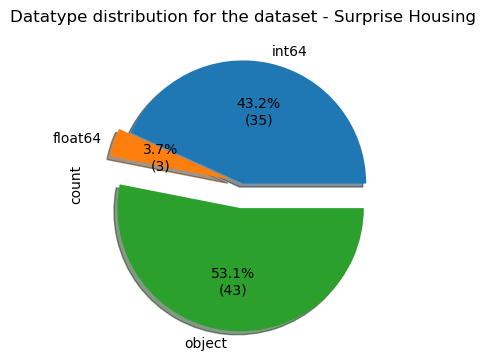

In [12]:
# Plot pie chart representing the datatypes of the dataframe
plot_datatype_pie_chart(train_data_df)

In [13]:
train_data_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,"1,460.00","1,460.00","1,201.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,452.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,379.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00"
mean,730.50,56.90,70.05,"10,516.83",6.10,5.58,"1,971.27","1,984.87",103.69,443.64,46.55,567.24,"1,057.43","1,162.63",346.99,5.84,"1,515.46",0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,"1,978.51",1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,"2,007.82","180,921.20"
std,421.61,42.30,24.28,"9,981.26",1.38,1.11,30.20,20.65,181.07,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,24.69,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,"79,442.50"
min,1.00,20.00,21.00,"1,300.00",1.00,1.00,"1,872.00","1,950.00",0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,"1,900.00",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,"2,006.00","34,900.00"
25%,365.75,20.00,59.00,"7,553.50",5.00,5.00,"1,954.00","1,967.00",0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,"1,129.50",0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,"1,961.00",1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,"2,007.00","129,975.00"
50%,730.50,50.00,69.00,"9,478.50",6.00,5.00,"1,973.00","1,994.00",0.00,383.50,0.00,477.50,991.50,"1,087.00",0.00,0.00,"1,464.00",0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,"1,980.00",2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,"2,008.00","163,000.00"
75%,"1,095.25",70.00,80.00,"11,601.50",7.00,6.00,"2,000.00","2,004.00",166.00,712.25,0.00,808.00,"1,298.25","1,391.25",728.00,0.00,"1,776.75",1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,"2,002.00",2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,"2,009.00","214,000.00"
max,"1,460.00",190.00,313.00,"215,245.00",10.00,9.00,"2,010.00","2,010.00","1,600.00","5,644.00","1,474.00","2,336.00","6,110.00","4,692.00","2,065.00",572.00,"5,642.00",3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,"2,010.00",4.00,"1,418.00",857.00,547.00,552.00,508.00,480.00,738.00,"15,500.00",12.00,"2,010.00","755,000.00"


<p style="background-color:lightgreen;"> Executing "describe" on the dataset reveals that there are columns which show a huge difference between the 75th percentile and the max. There is no linear increasing of the value making us to assument he presence of outliers. These needs to be handled gping forward.</p>

### <font color = green> <strong> Observations as per 'Data Importing' stage: </strong>
> 1. Dataset for "Surprise Housing" has 1460 rows and 81 columns
> 2. Columns datatype distribution: int64 - 35(43.2%) columns, float64 - 3(3.7%) columns and object - 43(53.1%) columns
    

### <font color = green> <strong> Analysis as per 'Data Importing' stage: </strong>
> 1. Large number of "object" datatype suggests that there might be columns with heterogenous values whcih needs to be handled
> 2. "SalePrice" will be our output variable for the analysis

***

## <font color = orange> <strong> <center> <u> DATA CLEANING AND PRE-PROCESSING </u> </center> </strong> </font>

##### <p style="background-color:skyblue;"> Check for missing values in the dataset and handle them </p>

In [14]:
missing_value_df = pd.Series(train_data_df.isnull().sum()).to_frame(name="Count")

missing_value_df = missing_value_df[missing_value_df["Count"] > 0]

In [15]:
missing_value_df["Percentage(%)"] = round(((missing_value_df["Count"]/train_data_df.shape[0])*100),2)
missing_value_df

,Count,Percentage(%)
LotFrontage,259,17.74
Alley,1369,93.77
MasVnrType,8,0.55
MasVnrArea,8,0.55
BsmtQual,37,2.53
BsmtCond,37,2.53
BsmtExposure,38,2.60
BsmtFinType1,37,2.53
BsmtFinType2,38,2.60
Electrical,1,0.07


<p style="background-color:lightgreen;"> For a dataset, few columns consists of unsually high percentage of "NA" values. Before considering removing these columns, deeper analysis into the columns and it's meaning is necessary </p>

In [16]:
# Retrieve column names consisting of missing values as per above analysis
missing_val_columns = missing_value_df.index.values.tolist()

In [17]:
missing_value_df["Datatype"] = train_data_df.dtypes[missing_val_columns]
missing_value_df
# dtypes = desc_stats.dtypes

,Count,Percentage(%),Datatype
LotFrontage,259,17.74,float64
Alley,1369,93.77,object
MasVnrType,8,0.55,object
MasVnrArea,8,0.55,float64
BsmtQual,37,2.53,object
BsmtCond,37,2.53,object
BsmtExposure,38,2.60,object
BsmtFinType1,37,2.53,object
BsmtFinType2,38,2.60,object
Electrical,1,0.07,object


In [18]:
# Print the data definition for all the missing columns as per analysos above
i =0
for column in missing_val_columns:
    if i % 2 == 0:
        print(Back.BLACK + Fore.WHITE+"Details for coloumn {}: {}".format(column,data_definition_df.loc[column]))
    else:
        print(Fore.BLACK + Back.WHITE+"Details for coloumn {}: {}".format(column,data_definition_df.loc[column]))
    print("----------------------------------------------------------------------------------")
    i = i+1

Details for coloumn LotFrontage: Description    Linear feet of street connected to property
Comment                                                NaN
Name: LotFrontage, dtype: object
----------------------------------------------------------------------------------
Details for coloumn Alley: Description                                        Type of alley access to property
Comment               Grvl\tGravel\n       Pave\tPaved\n       NA \tNo alley access
Name: Alley, dtype: object
----------------------------------------------------------------------------------
Details for coloumn MasVnrType: Description                                                                                                             Masonry veneer type
Comment               BrkCmn\tBrick Common\n       BrkFace\tBrick Face\n       CBlock\tCinder Block\n       None\tNone\n       Stone\tStone
Name: MasVnrType, dtype: object
----------------------------------------------------------------------------------
D

<p style="background-color:lightgreen;"> As per the above analysis of the columns with missing data in Surprise Housing dataset and matching the same to the data definition, it looks like most of the fields as per definition have an "NA" value. Hence, this is not the issue of missing device but a valid NA scenario being picked up as missing alues by our analysis.</p>

<p style="background-color:mediumseagreen;"> To handle the columns which have valid values as NA, we shall re-import the dataset using Pandas's parameter 'keep_default_na' to False.
</p>
<p style="background-color:mediumseagreen;">
Refer: <a href="https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html#pandas-read-csv">pandas-read-csv</a>
</p>

In [19]:
# Let's preserve the original import (incase needed later on)
train_data_orig_df = train_data_df.copy(deep=True)

# Read the data to be analysed (with "keep_default_na" set to FALSE)
train_data_df = pd.read_csv("surprise_housing_au_train.csv", keep_default_na=False)
add_attribute(train_data_df,"name","Surprise Housing")

<p style="background-color:mediumseagreen;">
Replace the original "NA" values in the dataset with another string, preferenably with "NOT APPLICABLE" or "NONE". We shall use "NONE"
</p>

In [20]:
train_data_df[missing_val_columns].replace("NA", "None")

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,65,None,BrkFace,196,Gd,TA,No,GLQ,Unf,SBrkr,None,Attchd,2003,RFn,TA,TA,None,None,None
1,80,None,None,0,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Attchd,1976,RFn,TA,TA,None,None,None
2,68,None,BrkFace,162,Gd,TA,Mn,GLQ,Unf,SBrkr,TA,Attchd,2001,RFn,TA,TA,None,None,None
3,60,None,None,0,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Detchd,1998,Unf,TA,TA,None,None,None
4,84,None,BrkFace,350,Gd,TA,Av,GLQ,Unf,SBrkr,TA,Attchd,2000,RFn,TA,TA,None,None,None
5,85,None,None,0,Gd,TA,No,GLQ,Unf,SBrkr,None,Attchd,1993,Unf,TA,TA,None,MnPrv,Shed
6,75,None,Stone,186,Ex,TA,Av,GLQ,Unf,SBrkr,Gd,Attchd,2004,RFn,TA,TA,None,None,None
7,None,None,Stone,240,Gd,TA,Mn,ALQ,BLQ,SBrkr,TA,Attchd,1973,RFn,TA,TA,None,None,Shed
8,51,None,None,0,TA,TA,No,Unf,Unf,FuseF,TA,Detchd,1931,Unf,Fa,TA,None,None,None
9,50,None,None,0,TA,TA,No,GLQ,Unf,SBrkr,TA,Attchd,1939,RFn,Gd,TA,None,None,None


In [21]:
train_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             1460 non-null   int64 
 1   MSSubClass     1460 non-null   int64 
 2   MSZoning       1460 non-null   object
 3   LotFrontage    1460 non-null   object
 4   LotArea        1460 non-null   int64 
 5   Street         1460 non-null   object
 6   Alley          1460 non-null   object
 7   LotShape       1460 non-null   object
 8   LandContour    1460 non-null   object
 9   Utilities      1460 non-null   object
 10  LotConfig      1460 non-null   object
 11  LandSlope      1460 non-null   object
 12  Neighborhood   1460 non-null   object
 13  Condition1     1460 non-null   object
 14  Condition2     1460 non-null   object
 15  BldgType       1460 non-null   object
 16  HouseStyle     1460 non-null   object
 17  OverallQual    1460 non-null   int64 
 18  OverallCond    1460 non-null

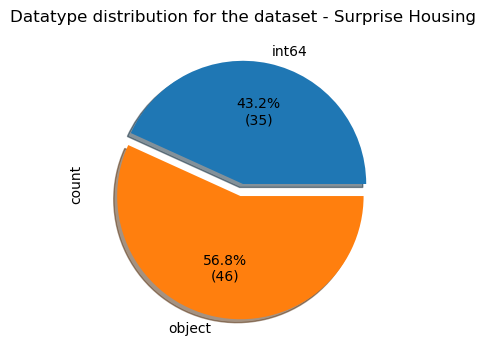

In [22]:
plot_datatype_pie_chart(train_data_df)

In [23]:
train_data_df.describe()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,"1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00"
mean,730.50,56.90,"10,516.83",6.10,5.58,"1,971.27","1,984.87",443.64,46.55,567.24,"1,057.43","1,162.63",346.99,5.84,"1,515.46",0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,"2,007.82","180,921.20"
std,421.61,42.30,"9,981.26",1.38,1.11,30.20,20.65,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,"79,442.50"
min,1.00,20.00,"1,300.00",1.00,1.00,"1,872.00","1,950.00",0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,"2,006.00","34,900.00"
25%,365.75,20.00,"7,553.50",5.00,5.00,"1,954.00","1,967.00",0.00,0.00,223.00,795.75,882.00,0.00,0.00,"1,129.50",0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,"2,007.00","129,975.00"
50%,730.50,50.00,"9,478.50",6.00,5.00,"1,973.00","1,994.00",383.50,0.00,477.50,991.50,"1,087.00",0.00,0.00,"1,464.00",0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,"2,008.00","163,000.00"
75%,"1,095.25",70.00,"11,601.50",7.00,6.00,"2,000.00","2,004.00",712.25,0.00,808.00,"1,298.25","1,391.25",728.00,0.00,"1,776.75",1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,"2,009.00","214,000.00"
max,"1,460.00",190.00,"215,245.00",10.00,9.00,"2,010.00","2,010.00","5,644.00","1,474.00","2,336.00","6,110.00","4,692.00","2,065.00",572.00,"5,642.00",3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,4.00,"1,418.00",857.00,547.00,552.00,508.00,480.00,738.00,"15,500.00",12.00,"2,010.00","755,000.00"


<p style="background-color:lightgreen;"> Executing "describe" on the dataset after the "NA" change during importing does reveal presence of outliers but most of the column types have now changes to object. Unless that is handled, it is difficult to conclude on the outliers based only on this method call.</p>

In [24]:
# Preserve the original missing value dataframe (incase needed later on)
missing_value_orig_df = missing_value_df.copy(deep=True)
# Preserve the original missing columns list (incase needed later on)
missing_val_columns = missing_val_columns

In [25]:
train_data_df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000
5,6,50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,2007,WD,Normal,307000
7,8,60,RL,NA,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939,RFn,1,205,Gd,TA,Y,0,4,0,0,0,

In [26]:
# Rename the "Datatype" column for clarity
missing_value_df.rename(columns = {"Datatype":"Datatype(Orginal)"}, inplace = True)
missing_value_df

,Count,Percentage(%),Datatype(Orginal)
LotFrontage,259,17.74,float64
Alley,1369,93.77,object
MasVnrType,8,0.55,object
MasVnrArea,8,0.55,float64
BsmtQual,37,2.53,object
BsmtCond,37,2.53,object
BsmtExposure,38,2.60,object
BsmtFinType1,37,2.53,object
BsmtFinType2,38,2.60,object
Electrical,1,0.07,object


In [27]:
# Add new column for the datatype for the previous missing values columns from the re-imported dataset
missing_value_df["Datatype(re-import)"] = train_data_df.dtypes[missing_val_columns]
missing_value_df

,Count,Percentage(%),Datatype(Orginal),Datatype(re-import)
LotFrontage,259,17.74,float64,object
Alley,1369,93.77,object,object
MasVnrType,8,0.55,object,object
MasVnrArea,8,0.55,float64,object
BsmtQual,37,2.53,object,object
BsmtCond,37,2.53,object,object
BsmtExposure,38,2.60,object,object
BsmtFinType1,37,2.53,object,object
BsmtFinType2,38,2.60,object,object
Electrical,1,0.07,object,object


In [28]:
# Add a new column to reflect the change in the dattype after re-import of the dataset

missing_value_df["Diff_Datatype"] = np.where((missing_value_df["Datatype(Orginal)"] != 
                                                      missing_value_df["Datatype(re-import)"]), "YES", "NO")
missing_value_df

,Count,Percentage(%),Datatype(Orginal),Datatype(re-import),Diff_Datatype
LotFrontage,259,17.74,float64,object,YES
Alley,1369,93.77,object,object,NO
MasVnrType,8,0.55,object,object,NO
MasVnrArea,8,0.55,float64,object,YES
BsmtQual,37,2.53,object,object,NO
BsmtCond,37,2.53,object,object,NO
BsmtExposure,38,2.60,object,object,NO
BsmtFinType1,37,2.53,object,object,NO
BsmtFinType2,38,2.60,object,object,NO
Electrical,1,0.07,object,object,NO


In [29]:
# Fetch and analyse the columns whose datatypes have changed after re-import of the dataset
only_dtype_changed_df = missing_value_df[missing_value_df["Diff_Datatype"] == "YES"]

only_dtype_changed_df

# missing_value_df = pd.Series(train_data_df.isnull().sum()).to_frame(name="Count")
# missing_value_df = missing_value_df[missing_value_df["Count"] > 0]
# missing_value_df["Percentage(%)"] = round(((missing_value_df["Count"]/train_data_df.shape[0])*100),2)
# missing_value_df

,Count,Percentage(%),Datatype(Orginal),Datatype(re-import),Diff_Datatype
LotFrontage,259,17.74,float64,object,YES
MasVnrArea,8,0.55,float64,object,YES
GarageYrBlt,81,5.55,float64,object,YES


<p style="background-color:lightgreen;">
    We observe that 3 columns have undergone a change in their datatypes on re-importing the dataset. These columns needs to analysed further and if needed their datatypes fixed before we proceed to analyse the missing value ont eh re-imported dataframe
</p>

In [30]:
# Print the data definition for all the columns whose datatypes have changed
i =0
for column in only_dtype_changed_df.index.values.tolist():
    if i % 2 == 0:
        print(Back.BLACK + Fore.WHITE+"Details for coloumn {}: {}".format(column,data_definition_df.loc[column]))
    else:
        print(Fore.BLACK + Back.WHITE+"Details for coloumn {}: {}".format(column,data_definition_df.loc[column]))
    print("----------------------------------------------------------------------------------")
    i = i+1

Details for coloumn LotFrontage: Description    Linear feet of street connected to property
Comment                                                NaN
Name: LotFrontage, dtype: object
----------------------------------------------------------------------------------
Details for coloumn MasVnrArea: Description    Masonry veneer area in square feet
Comment                                       NaN
Name: MasVnrArea, dtype: object
----------------------------------------------------------------------------------
Details for coloumn GarageYrBlt: Description    Year garage was built
Comment                          NaN
Name: GarageYrBlt, dtype: object
----------------------------------------------------------------------------------


In [31]:
train_data_df.LotFrontage.unique()

array(['65', '80', '68', '60', '84', '85', '75', 'NA', '51', '50', '70',
       '91', '72', '66', '101', '57', '44', '110', '98', '47', '108',
       '112', '74', '115', '61', '48', '33', '52', '100', '24', '89',
       '63', '76', '81', '95', '69', '21', '32', '78', '121', '122', '40',
       '105', '73', '77', '64', '94', '34', '90', '55', '88', '82', '71',
       '120', '107', '92', '134', '62', '86', '141', '97', '54', '41',
       '79', '174', '99', '67', '83', '43', '103', '93', '30', '129',
       '140', '35', '37', '118', '87', '116', '150', '111', '49', '96',
       '59', '36', '56', '102', '58', '38', '109', '130', '53', '137',
       '45', '106', '104', '42', '39', '144', '114', '128', '149', '313',
       '168', '182', '138', '160', '152', '124', '153', '46'],
      dtype=object)

In [32]:
train_data_df.MasVnrArea.unique()

array(['196', '0', '162', '350', '186', '240', '286', '306', '212', '180',
       '380', '281', '640', '200', '246', '132', '650', '101', '412',
       '272', '456', '1031', '178', '573', '344', '287', '167', '1115',
       '40', '104', '576', '443', '468', '66', '22', '284', '76', '203',
       '68', '183', '48', '28', '336', '600', '768', '480', '220', '184',
       '1129', '116', '135', '266', '85', '309', '136', '288', '70',
       '320', '50', '120', '436', '252', '84', '664', '226', '300', '653',
       '112', '491', '268', '748', '98', '275', '138', '205', '262',
       '128', '260', '153', '64', '312', '16', '922', '142', '290', '127',
       '506', '297', 'NA', '604', '254', '36', '102', '472', '481', '108',
       '302', '172', '399', '270', '46', '210', '174', '348', '315',
       '299', '340', '166', '72', '31', '34', '238', '1600', '365', '56',
       '150', '278', '256', '225', '370', '388', '175', '296', '146',
       '113', '176', '616', '30', '106', '870', '362', '530'

In [33]:
train_data_df.GarageYrBlt.unique()

array(['2003', '1976', '2001', '1998', '2000', '1993', '2004', '1973',
       '1931', '1939', '1965', '2005', '1962', '2006', '1960', '1991',
       '1970', '1967', '1958', '1930', '2002', '1968', '2007', '2008',
       '1957', '1920', '1966', '1959', '1995', '1954', '1953', 'NA',
       '1983', '1977', '1997', '1985', '1963', '1981', '1964', '1999',
       '1935', '1990', '1945', '1987', '1989', '1915', '1956', '1948',
       '1974', '2009', '1950', '1961', '1921', '1900', '1979', '1951',
       '1969', '1936', '1975', '1971', '1923', '1984', '1926', '1955',
       '1986', '1988', '1916', '1932', '1972', '1918', '1980', '1924',
       '1996', '1940', '1949', '1994', '1910', '1978', '1982', '1992',
       '1925', '1941', '2010', '1927', '1947', '1937', '1942', '1938',
       '1952', '1928', '1922', '1934', '1906', '1914', '1946', '1908',
       '1929', '1933'], dtype=object)

In [34]:
temp_df = train_data_df[["GarageType","GarageYrBlt"]].copy(deep=True)
temp_df.head(40)

,GarageType,GarageYrBlt
0,Attchd,2003
1,Attchd,1976
2,Attchd,2001
3,Detchd,1998
4,Attchd,2000
5,Attchd,1993
6,Attchd,2004
7,Attchd,1973
8,Detchd,1931
9,Attchd,1939


<p style="background-color:lightgreen;">
As per the data-definition of the three columns, we can conclude that the columns "LotFrontage" and "MasVnrArea" should be changed to float type. For Column "GarageYrBlt", on analysis it found to be dependent on the column "GarageType" which can have a valid "NA" value signifying that there isn't any garage facility for the concerned property. Column "GarageYrBlt" can be left as objext type
</p>

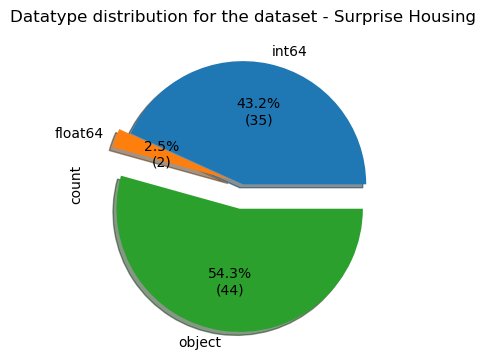

In [35]:
## Convert two columns to 'numeric' type as mentioned above
train_data_df['LotFrontage'] = pd.to_numeric(train_data_df['LotFrontage'], errors='coerce')
train_data_df['MasVnrArea'] = pd.to_numeric(train_data_df['MasVnrArea'], errors='coerce')

plot_datatype_pie_chart(train_data_df)

In [36]:
missing_value_df = pd.Series(train_data_df.isnull().sum()).to_frame(name="Count")
missing_value_df = missing_value_df[missing_value_df["Count"] > 0]
missing_value_df["Percentage(%)"] = round(((missing_value_df["Count"]/train_data_df.shape[0])*100),2)
missing_value_df

missing_value_df

,Count,Percentage(%)
LotFrontage,259,17.74
MasVnrArea,8,0.55


##### <p style="background-color:pink;"> Handling missing value for column "LotFrontage" </p>

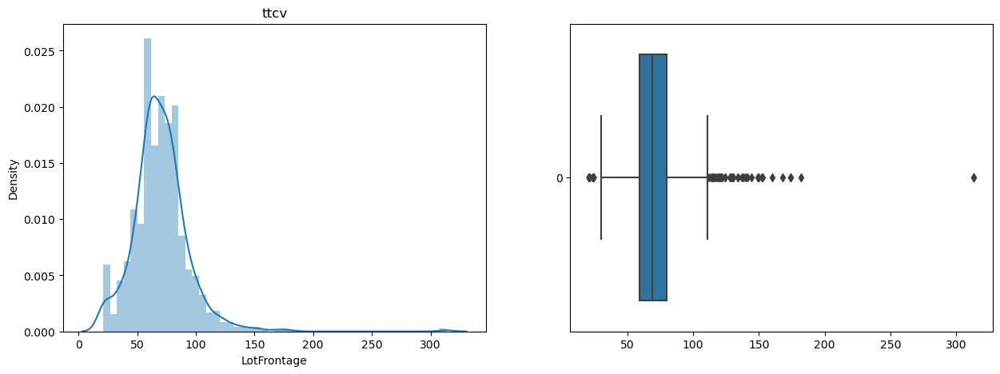

In [37]:
# Box plot for column "LotFrontage"

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.title("ttcv", fontdict={'fontsize': 12})
sns.distplot(train_data_df.LotFrontage)

plt.subplot(1,2,2)
sns.boxplot(train_data_df.LotFrontage, orient='h')
plt.show()

In [38]:
# Analyse the statistics associated with column "LotArea"
train_data_df.describe().get("LotFrontage")

count   1,201.00
mean       70.05
std        24.28
min        21.00
25%        59.00
50%        69.00
75%        80.00
max       313.00
Name: LotFrontage, dtype: float64

In [39]:
# Get all the values and their counts for column "LotArea"
train_data_df.LotFrontage.value_counts()

60.00     143
70.00      70
80.00      69
50.00      57
75.00      53
65.00      44
85.00      40
78.00      25
21.00      23
90.00      23
68.00      19
64.00      19
24.00      19
73.00      18
55.00      17
63.00      17
79.00      17
72.00      17
100.00     16
66.00      15
74.00      15
51.00      15
52.00      14
59.00      13
82.00      12
71.00      12
67.00      12
43.00      12
40.00      12
57.00      12
76.00      11
69.00      11
92.00      10
34.00      10
53.00      10
86.00      10
88.00      10
84.00       9
35.00       9
62.00       9
44.00       9
77.00       9
93.00       8
98.00       8
96.00       8
61.00       8
95.00       7
58.00       7
120.00      7
107.00      7
94.00       6
81.00       6
36.00       6
30.00       6
48.00       6
91.00       6
41.00       6
54.00       6
89.00       6
110.00      6
105.00      6
32.00       5
47.00       5
87.00       5
56.00       5
37.00       5
83.00       5
102.00      4
42.00       4
49.00       4
104.00      3
103.00

In [40]:
print(Fore.GREEN +"Mean value for column '{}' is {}".format("LotFrontage",train_data_df.LotFrontage.mean(numeric_only=True)))
print(Fore.BLUE + "Median value for column '{}' is {}".format("LotFrontage", train_data_df.LotFrontage.median(numeric_only=True)))
print(Fore.YELLOW + "Mode value for column '{}' is {}".format("LotFrontage", train_data_df.LotFrontage.mode()))

print(Fore.RED + "Maximum value for column '{}' is {}".format("LotFrontage", train_data_df['LotFrontage'].max()))

Mean value for column 'LotFrontage' is 70.04995836802665
Median value for column 'LotFrontage' is 69.0
Mode value for column 'LotFrontage' is 0   60.00
Name: LotFrontage, dtype: float64
Maximum value for column 'LotFrontage' is 313.0


<p style="background-color:lightgreen;">
From the above analysis for column "LotFrontage", we conclude that the column has high maximum value and these values are outliers so using the mean would not be an affective solution for using as missing value substitution.
</p>
<p style="background-color:lightgreen;">
Proceeding with replacing the missing values for column "LotFrontage" with median value i.e., 69
</p>

In [41]:
train_data_df['LotFrontage'].fillna(train_data_df['LotFrontage'].median(), inplace=True)

train_data_df.LotFrontage.value_counts()

69.00     270
60.00     143
70.00      70
80.00      69
50.00      57
75.00      53
65.00      44
85.00      40
78.00      25
21.00      23
90.00      23
24.00      19
68.00      19
64.00      19
73.00      18
55.00      17
63.00      17
72.00      17
79.00      17
100.00     16
74.00      15
66.00      15
51.00      15
52.00      14
59.00      13
82.00      12
71.00      12
43.00      12
67.00      12
40.00      12
57.00      12
76.00      11
34.00      10
53.00      10
86.00      10
92.00      10
88.00      10
44.00       9
84.00       9
35.00       9
62.00       9
77.00       9
93.00       8
98.00       8
96.00       8
61.00       8
95.00       7
58.00       7
120.00      7
107.00      7
94.00       6
81.00       6
36.00       6
30.00       6
48.00       6
91.00       6
41.00       6
54.00       6
89.00       6
110.00      6
105.00      6
32.00       5
47.00       5
87.00       5
56.00       5
37.00       5
83.00       5
102.00      4
49.00       4
42.00       4
104.00      3
103.00

In [42]:
# Analyse the statistics associated with column "LotArea"
train_data_df.describe().get("LotFrontage")

count   1,460.00
mean       69.86
std        22.03
min        21.00
25%        60.00
50%        69.00
75%        79.00
max       313.00
Name: LotFrontage, dtype: float64

In [43]:
train_data_df.LotFrontage.isna().sum()

0

##### <p style="background-color:pink;"> Handling missing value for column "MasVnrArea" </p>

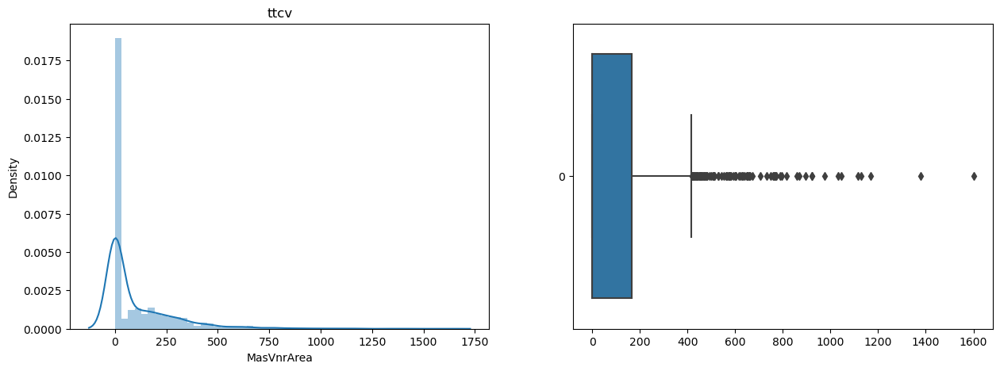

In [44]:
# Box plot for column "MasVnrArea"

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.title("ttcv", fontdict={'fontsize': 12})
sns.distplot(train_data_df.MasVnrArea)

plt.subplot(1,2,2)
sns.boxplot(train_data_df.MasVnrArea, orient='h')
plt.show()

In [45]:
# Analyse the statistics associated with column "LotArea"
train_data_df.describe().get("MasVnrArea")

count   1,452.00
mean      103.69
std       181.07
min         0.00
25%         0.00
50%         0.00
75%       166.00
max     1,600.00
Name: MasVnrArea, dtype: float64

In [46]:
# Get all the values and their counts for column "LotArea"
train_data_df.MasVnrArea.value_counts()

0.00        861
180.00        8
72.00         8
108.00        8
120.00        7
16.00         7
200.00        6
340.00        6
106.00        6
80.00         6
132.00        5
320.00        5
360.00        5
84.00         5
170.00        5
220.00        4
336.00        4
183.00        4
252.00        4
196.00        4
300.00        4
268.00        4
40.00         4
168.00        4
100.00        4
270.00        4
210.00        4
76.00         4
288.00        4
216.00        4
160.00        4
178.00        4
246.00        4
456.00        4
74.00         3
70.00         3
50.00         3
44.00         3
272.00        3
226.00        3
104.00        3
116.00        3
90.00         3
145.00        3
148.00        3
42.00         3
110.00        3
128.00        3
85.00         3
136.00        3
420.00        3
186.00        3
256.00        3
166.00        3
350.00        3
130.00        3
99.00         3
176.00        3
174.00        3
208.00        3
312.00        3
169.00        3
240.00  

In [47]:
print(Fore.GREEN +"Mean value for column '{}' is {}".format("MasVnrArea",train_data_df.MasVnrArea.mean(numeric_only=True)))
print(Fore.BLUE + "Median value for column '{}' is {}".format("MasVnrArea", train_data_df.MasVnrArea.median(numeric_only=True)))
print(Fore.YELLOW + "Mode value for column '{}' is {}".format("MasVnrArea", train_data_df.MasVnrArea.mode()))

print(Fore.RED + "Maximum value for column '{}' is {}".format("MasVnrArea", train_data_df['MasVnrArea'].max()))

Mean value for column 'MasVnrArea' is 103.68526170798899
Median value for column 'MasVnrArea' is 0.0
Mode value for column 'MasVnrArea' is 0   0.00
Name: MasVnrArea, dtype: float64
Maximum value for column 'MasVnrArea' is 1600.0


<p style="background-color:lightgreen;">
From the above analysis for column "MasVnrArea", it has value 0 as median and mode.
</p>
<p style="background-color:lightgreen;">
Proceeding with replacing the missing values for column "MasVnrArea" with mean value i.e., 103
</p>

In [48]:
train_data_df['MasVnrArea'].fillna(train_data_df['MasVnrArea'].mean(), inplace=True)

train_data_df.MasVnrArea.value_counts()

0.00        861
103.69        8
72.00         8
108.00        8
180.00        8
120.00        7
16.00         7
340.00        6
106.00        6
80.00         6
200.00        6
360.00        5
170.00        5
84.00         5
320.00        5
132.00        5
196.00        4
220.00        4
336.00        4
252.00        4
168.00        4
300.00        4
268.00        4
76.00         4
100.00        4
270.00        4
210.00        4
183.00        4
288.00        4
160.00        4
178.00        4
246.00        4
40.00         4
456.00        4
216.00        4
74.00         3
70.00         3
50.00         3
44.00         3
226.00        3
272.00        3
104.00        3
85.00         3
90.00         3
148.00        3
145.00        3
42.00         3
128.00        3
110.00        3
312.00        3
136.00        3
176.00        3
186.00        3
130.00        3
420.00        3
350.00        3
169.00        3
208.00        3
174.00        3
99.00         3
166.00        3
82.00         3
240.00  

In [49]:
# Analyse the statistics associated with column "MasVnrArea"
train_data_df.describe().get("MasVnrArea")

count   1,460.00
mean      103.69
std       180.57
min         0.00
25%         0.00
50%         0.00
75%       164.25
max     1,600.00
Name: MasVnrArea, dtype: float64

In [50]:
train_data_df.MasVnrArea.isna().sum()

0

##### <p style="background-color:skyblue;"> Check if there are any duplicate rows in the dataset </p>

In [51]:
duplicate_rows = train_data_df[train_data_df.duplicated()]

print(Back.YELLOW + Style.BRIGHT +"Number of duplicate rows in the dataset '{}' is {}"
      .format(train_data_df.attrs["name"], duplicate_rows.shape[0]))

Number of duplicate rows in the dataset 'Surprise Housing' is 0


##### <p style="background-color:skyblue;"> Check and handle if any of the column names have leading or trailing empty spaces and correct it </p>

In [52]:
for i in range(0,len(column_list)):
    train_data_df.rename(columns = {column_list[i]:column_list[i].strip()}, inplace = True)

##### <p style="background-color:skyblue;"> Check if there are any columns with a single value for all the rows in the dataframe </p>

In [53]:
columns_one_value_list = train_data_df.columns[train_data_df.nunique() == 1].to_list()

print(Fore.MAGENTA + "Columns with only one value: {}".format(columns_one_value_list))

Columns with only one value: []


##### <p style="background-color:skyblue;"> Verify 'YearBuilt' is less than 'YrSold' </p>

In [54]:
temp = train_data_df["YrSold"] >= (train_data_df["YearBuilt"])
print(Fore.MAGENTA + "Rows with '{}' value less than '{}': {}".format("YrSold", "YearBuilt",
                                                                      train_data_df.shape[0] - temp.value_counts().sum()))

Rows with 'YrSold' value less than 'YearBuilt': 0


In [55]:
columns_one_value_list = train_data_df.columns[train_data_df.nunique() == 1].to_list()

print(Fore.MAGENTA + "Columns with only one value: {}".format(columns_one_value_list))

Columns with only one value: []


<p style="background-color:skyblue;"> Check if there are any columns with a single value for all the rows in the dataframe </p>

In [56]:
columns_all_unique_values_list = train_data_df.columns[train_data_df.nunique() >= len(train_data_df)].to_list()

print(Fore.MAGENTA + "Columns with all unique values: {}".format(columns_all_unique_values_list))

Columns with all unique values: ['Id']


<p style="background-color:lightgreen;">
Column with all unique value adds no value to our analysis and hence can be dropped
</p>

In [57]:
# Dropping column "Id"
train_data_df.drop("Id", axis = 1, inplace=True)

In [58]:
# Re-Examining the datframe shape
train_data_df.shape

(1460, 80)

In [59]:
# Re-examining the dataframe statistics
train_data_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,"1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00"
mean,56.90,69.86,"10,516.83",6.10,5.58,"1,971.27","1,984.87",103.69,443.64,46.55,567.24,"1,057.43","1,162.63",346.99,5.84,"1,515.46",0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,"2,007.82","180,921.20"
std,42.30,22.03,"9,981.26",1.38,1.11,30.20,20.65,180.57,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,"79,442.50"
min,20.00,21.00,"1,300.00",1.00,1.00,"1,872.00","1,950.00",0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,"2,006.00","34,900.00"
25%,20.00,60.00,"7,553.50",5.00,5.00,"1,954.00","1,967.00",0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,"1,129.50",0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,"2,007.00","129,975.00"
50%,50.00,69.00,"9,478.50",6.00,5.00,"1,973.00","1,994.00",0.00,383.50,0.00,477.50,991.50,"1,087.00",0.00,0.00,"1,464.00",0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,"2,008.00","163,000.00"
75%,70.00,79.00,"11,601.50",7.00,6.00,"2,000.00","2,004.00",164.25,712.25,0.00,808.00,"1,298.25","1,391.25",728.00,0.00,"1,776.75",1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,"2,009.00","214,000.00"
max,190.00,313.00,"215,245.00",10.00,9.00,"2,010.00","2,010.00","1,600.00","5,644.00","1,474.00","2,336.00","6,110.00","4,692.00","2,065.00",572.00,"5,642.00",3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,4.00,"1,418.00",857.00,547.00,552.00,508.00,480.00,738.00,"15,500.00",12.00,"2,010.00","755,000.00"


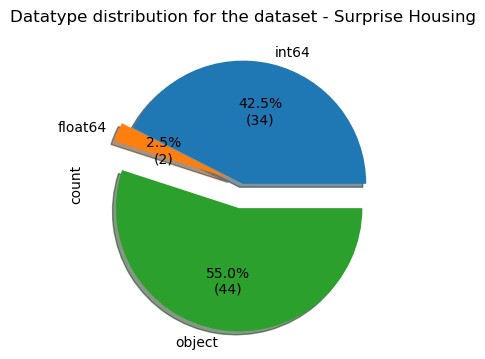

In [60]:
plot_datatype_pie_chart(train_data_df)

##### <p style="background-color:skyblue;"> Convert relevant columns to category types for better clarity </p>

In [61]:
train_data_df.head(21)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.00,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,20,RL,80.00,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,60,RL,68.00,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,70,RL,60.00,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,60,RL,84.00,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000
5,50,RL,85.00,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,20,RL,75.00,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,2007,WD,Normal,307000
7,60,RL,69.00,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,2009,WD,Normal,200000
8,50,RM,51.00,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,2008,WD,Abnorml,129900
9,190,RL,50.00,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attc

In [62]:
category_columns = ['MSSubClass', 'MSZoning', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

for column in category_columns:
    train_data_df[column] = train_data_df[column].astype("category")

train_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   category
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1460 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   Alley          1460 non-null   category
 6   LotShape       1460 non-null   category
 7   LandContour    1460 non-null   category
 8   Utilities      1460 non-null   category
 9   LotConfig      1460 non-null   category
 10  LandSlope      1460 non-null   category
 11  Neighborhood   1460 non-null   category
 12  Condition1     1460 non-null   category
 13  Condition2     1460 non-null   category
 14  BldgType       1460 non-null   category
 15  HouseStyle     1460 non-null   category
 16  OverallQual    1460 non-null   category
 17  OverallCond    1460 non-null   ca

## <font color = orange> <strong> <center> <u> FEATURE ENGINEERING </u> </center> </strong> </font>

In [63]:
# Can create "AgeOnSelling" column using "YrSold" and "YearBuilt" columns

train_data_df["AgeOnSelling"] = train_data_df["YrSold"]-train_data_df["YearBuilt"]
train_data_df[["YrSold", "YearBuilt", "AgeOnSelling"]].corr()

,YrSold,YearBuilt,AgeOnSelling
YrSold,1.00,-0.01,0.06
YearBuilt,-0.01,1.00,-1.00
AgeOnSelling,0.06,-1.00,1.00


<Axes: >

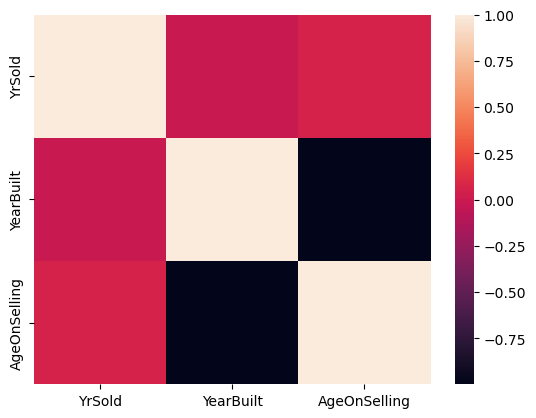

In [64]:
sns.heatmap(train_data_df[["YrSold", "YearBuilt", "AgeOnSelling"]].corr())

In [65]:
# Drop columns "YearBuilt" and "YearSold"

train_data_df.drop(["YearBuilt"],axis=1, inplace=True)
train_data_df.drop(["YrSold"],axis=1, inplace=True)

In [66]:
numeric_only_columns_df = train_data_df.select_dtypes(include=["int64","float64"])
numeric_columns = numeric_only_columns_df.columns.tolist()

In [67]:
numeric_only_columns_df.head(15)

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling
0,65.00,8450,2003,196.00,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,208500,5
1,80.00,9600,1976,0.00,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,181500,31
2,68.00,11250,2002,162.00,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,223500,7
3,60.00,9550,1970,0.00,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,140000,91
4,84.00,14260,2000,350.00,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,250000,8
5,85.00,14115,1995,0.00,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,2,480,40,30,0,320,0,0,700,10,143000,16
6,75.00,10084,2005,186.00,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2,636,255,57,0,0,0,0,0,8,307000,3
7,69.00,10382,1973,240.00,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,2,484,235,204,228,0,0,0,350,11,200000,36
8,51.00,6120,1950,0.00,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,2,468,90,0,205,0,0,0,0,4,129900,77
9,50.00,7420,1950,0.00,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1,205,0,4,0,0,0,0,0,1,118000,69


In [68]:
category_only_columns_df = train_data_df.select_dtypes(include="category")

## <font color = orange> <strong> <center> <u> EDA - EXPLORATORY DATA ANALYSIS </u> </center> </strong> </font>

##### <p style="background-color:pink;"> Univariate Analysis </p>

##### <p style="background-color:cyan;"> Univariate Analysis of output variable i.e., "SalePrice" </p>

<Axes: xlabel='SalePrice', ylabel='Density'>

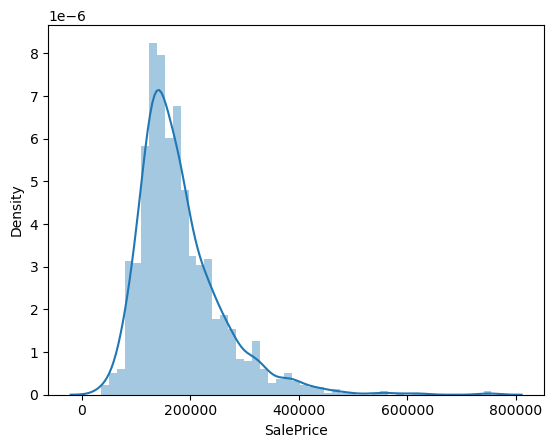

In [69]:
sns.distplot(train_data_df['SalePrice'])

<Axes: >

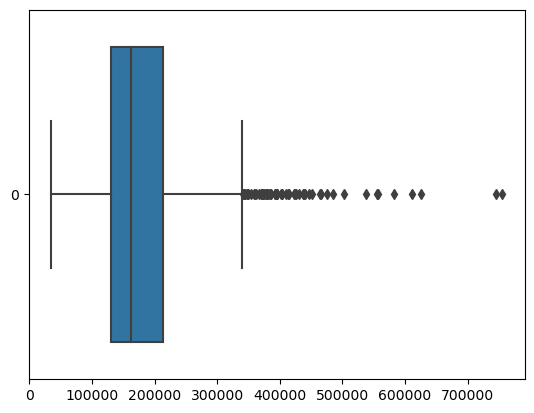

In [70]:
sns.boxplot(train_data_df["SalePrice"], orient="h")

In [71]:
train_data_df.describe().get("SalePrice")

count     1,460.00
mean    180,921.20
std      79,442.50
min      34,900.00
25%     129,975.00
50%     163,000.00
75%     214,000.00
max     755,000.00
Name: SalePrice, dtype: float64

In [72]:
train_data_df["SalePrice"].skew()

1.8828757597682129

In [73]:
train_data_df["SalePrice"].kurtosis()

6.536281860064529

In [74]:
train_data_df["SalePrice"].std()

79442.50288288663

<p style="background-color:lightgreen;">
From the above analysis, we can infer that<br>
    1. The response variable "SalePrice" values are skewed - positive skewed to be specific. This implies that the data has longer right tail and the most of the values are concentrated to the left. Hence, Mean is greater than median value.<br>
    2. There is presence of outliers.<br>
    3. Normal distribution of the data is not seen.<br>
    4. Skew value is greater than 1, confirming the highly skewed nature of the data<br>
    5. High kurtosis value signifies highly poeaked values i.e., Leptokurtic to be specific
</p>

References:
> 1.  <a href="https://medium.com/swlh/skewness-and-kurtosis-in-statistics-a0314c8882d7">Source_1</a>
  2.  <a href="https://medium.com/@anujkumar0617/skewness-and-kurtosis-fc063ee8f6f">Source_2</a>


In [75]:
train_data_df.head(15)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,AgeOnSelling
0,60,RL,65.00,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,WD,Normal,208500,5
1,20,RL,80.00,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,WD,Normal,181500,31
2,60,RL,68.00,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,WD,Normal,223500,7
3,70,RL,60.00,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,WD,Abnorml,140000,91
4,60,RL,84.00,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,WD,Normal,250000,8
5,50,RL,85.00,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1995,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,WD,Normal,143000,16
6,20,RL,75.00,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,WD,Normal,307000,3
7,60,RL,69.00,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,WD,Normal,200000,36
8,50,RM,51.00,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,WD,Abnorml,129900,77
9,190,RL,50.00,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1950,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,NA,NA,NA,0,1,WD,Normal,118000,69


In [76]:
# Trying Logirthimic transformation to reduce skewness

saleprice_col_df = train_data_df["SalePrice"].to_frame()

saleprice_col_df["SalePrice_Log"] = np.log(saleprice_col_df["SalePrice"])
saleprice_col_df["SalePrice_Sqrt"] = np.sqrt(saleprice_col_df["SalePrice"])

saleprice_col_df.head(15)

,SalePrice,SalePrice_Log,SalePrice_Sqrt
0,208500,12.25,456.62
1,181500,12.11,426.03
2,223500,12.32,472.76
3,140000,11.85,374.17
4,250000,12.43,500.00
5,143000,11.87,378.15
6,307000,12.63,554.08
7,200000,12.21,447.21
8,129900,11.77,360.42
9,118000,11.68,343.51


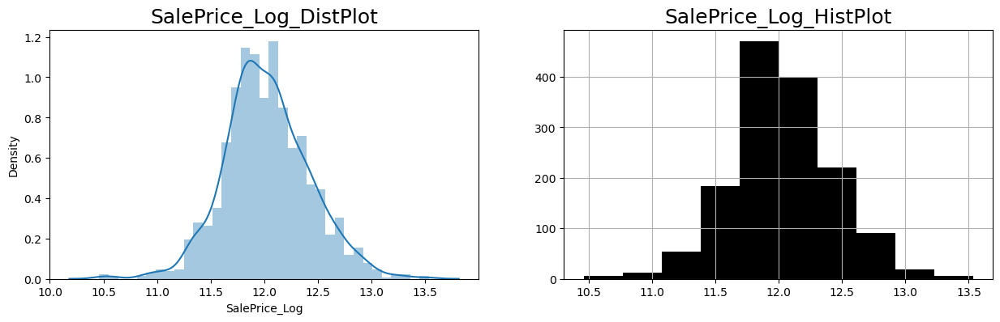

In [77]:
# Plot log transformation
plt.figure(figsize=(15,5))
  
plt.subplot(1,2,1)
plt.title("SalePrice_Log_DistPlot", fontdict={'fontsize': 18})
sns.distplot(saleprice_col_df["SalePrice_Log"])
    
plt.subplot(1,2,2)
plt.title("SalePrice_Log_HistPlot", fontdict={'fontsize': 18})
saleprice_col_df["SalePrice_Log"].hist(bins = 10, figsize = (15,4), color = 'black')
plt.show()

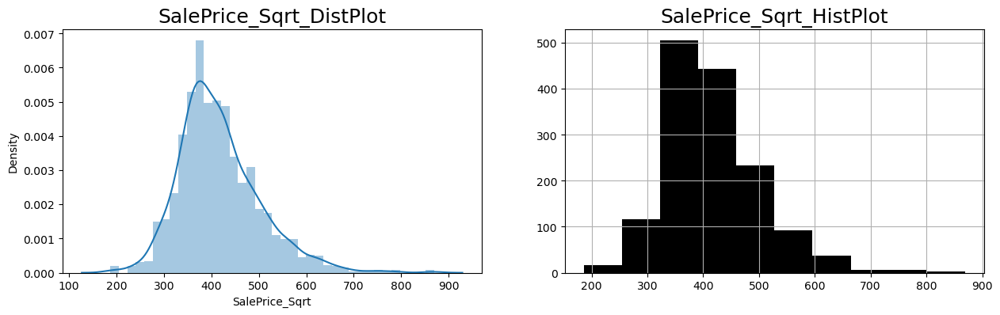

In [78]:
# Plot Square root transformation
plt.figure(figsize=(15,5))
  
plt.subplot(1,2,1)
plt.title("SalePrice_Sqrt_DistPlot", fontdict={'fontsize': 18})
sns.distplot(saleprice_col_df["SalePrice_Sqrt"])
    
plt.subplot(1,2,2)
plt.title("SalePrice_Sqrt_HistPlot", fontdict={'fontsize': 18})
saleprice_col_df["SalePrice_Sqrt"].hist(bins = 10, figsize = (15,4), color = 'black')
plt.show()
    
    

<p style="background-color:lightgreen;">
After above analysis, we can conclude that the log transformation adresses the skewness better.
</p>

In [79]:
# Applying log transformation to response variable on the dataframe

train_data_df["SalePrice"] = np.log(train_data_df["SalePrice"])

train_data_df.head(15)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,AgeOnSelling
0,60,RL,65.00,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.00,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,WD,Normal,12.25,5
1,20,RL,80.00,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,WD,Normal,12.11,31
2,60,RL,68.00,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,WD,Normal,12.32,7
3,70,RL,60.00,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,WD,Abnorml,11.85,91
4,60,RL,84.00,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.00,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,WD,Normal,12.43,8
5,50,RL,85.00,14115,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1995,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NA,Attchd,1993,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NA,MnPrv,Shed,700,10,WD,Normal,11.87,16
6,20,RL,75.00,10084,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.00,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NA,NA,NA,0,8,WD,Normal,12.63,3
7,60,RL,69.00,10382,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.00,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NA,NA,Shed,350,11,WD,Normal,12.21,36
8,50,RM,51.00,6120,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NA,NA,NA,0,4,WD,Abnorml,11.77,77
9,190,RL,50.00,7420,Pave,NA,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1950,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,NA,NA,NA,0,1,WD,Normal,11.68,69


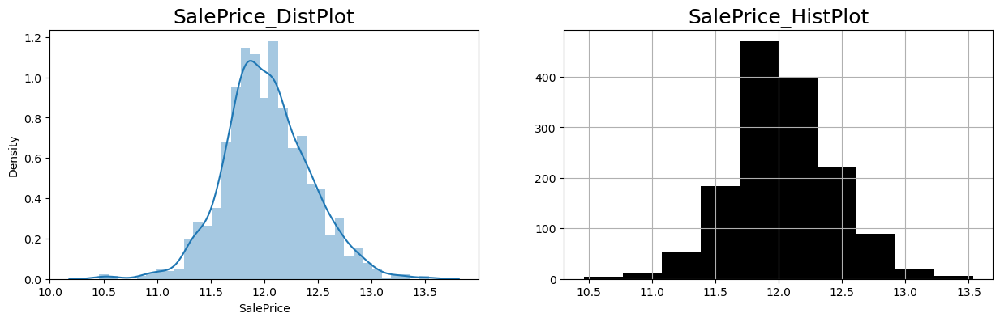

In [80]:
plt.figure(figsize=(15,5))
  
plt.subplot(1,2,1)
plt.title("SalePrice_DistPlot", fontdict={'fontsize': 18})
sns.distplot(train_data_df["SalePrice"])
    
plt.subplot(1,2,2)
plt.title("SalePrice_HistPlot", fontdict={'fontsize': 18})
train_data_df["SalePrice"].hist(bins = 10, figsize = (15,4), color = 'black')

plt.show()

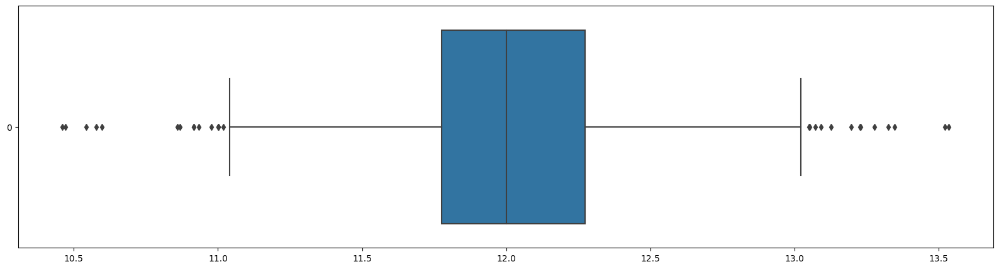

In [81]:
plt.figure(figsize=(20,5))
sns.boxplot(train_data_df["SalePrice"], orient="h")
plt.show()

<p style="background-color:lightgreen;">
After above analysis, we can conclude that the log transformation adresses the skewness better.
</p>

### <font color = lightblue> <strong> Observations as per 'Data Importing' stage: </strong>
> 1. Dataset for "Surprise Housing" has 1460 rows and 81 columns
> 2. Columns datatype distribution: int64 - 35(43.2%) columns, float64 - 3(3.7%) columns and object - 43(53.1%) columns

### <font color = green> <strong> Analysis as per 'Data Importing' stage: </strong>
> 1. Large number of "object" datatype suggests that there might be columns with heterogenous values whcih needs to be handled
> 2. "SalePrice" will be our output variable for the analysis

##### <p style="background-color:cyan;"> Univariate Analysis of categorical variables </p>

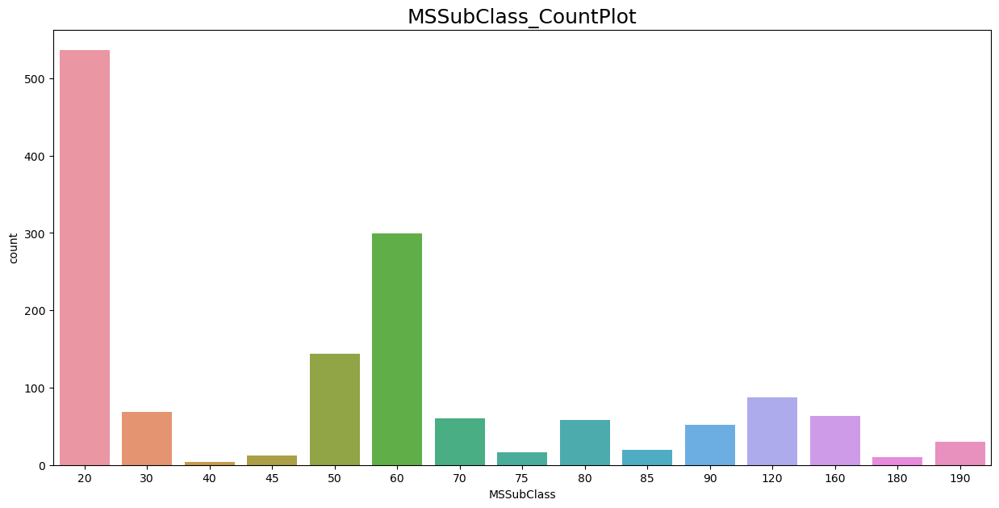

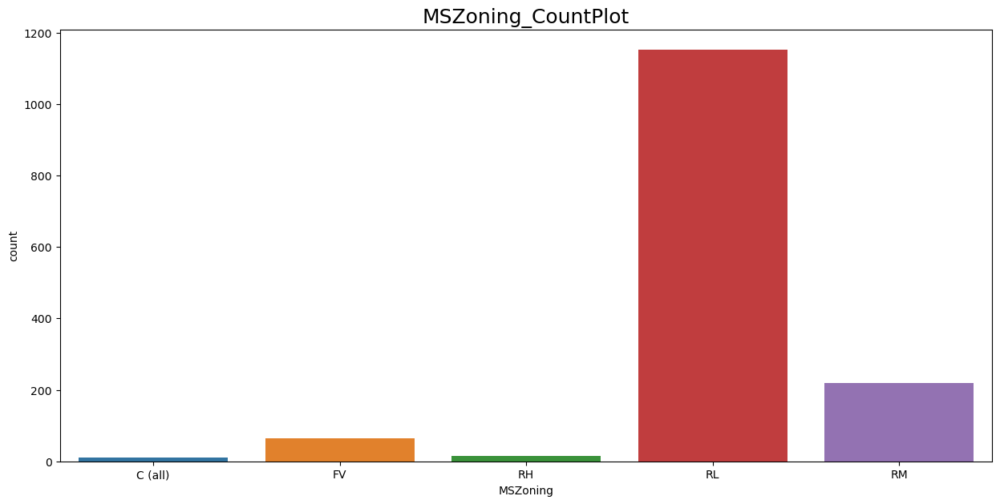

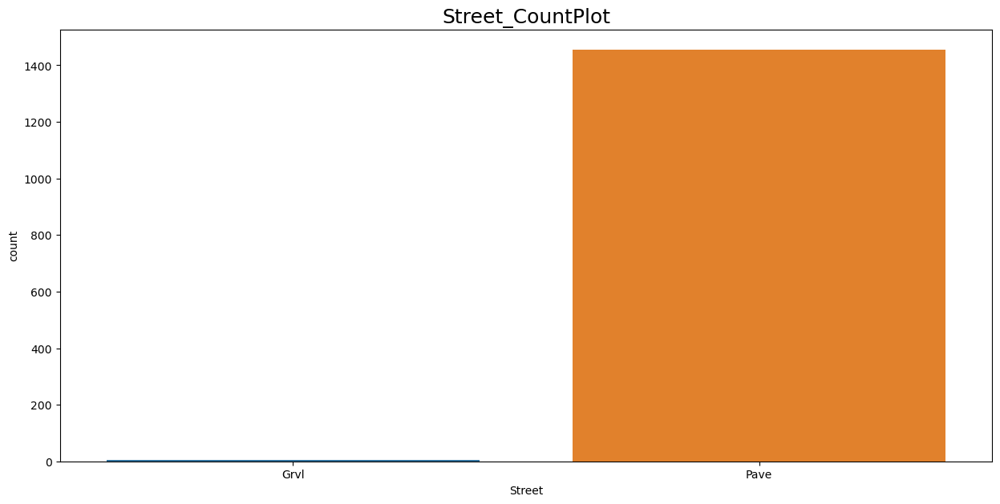

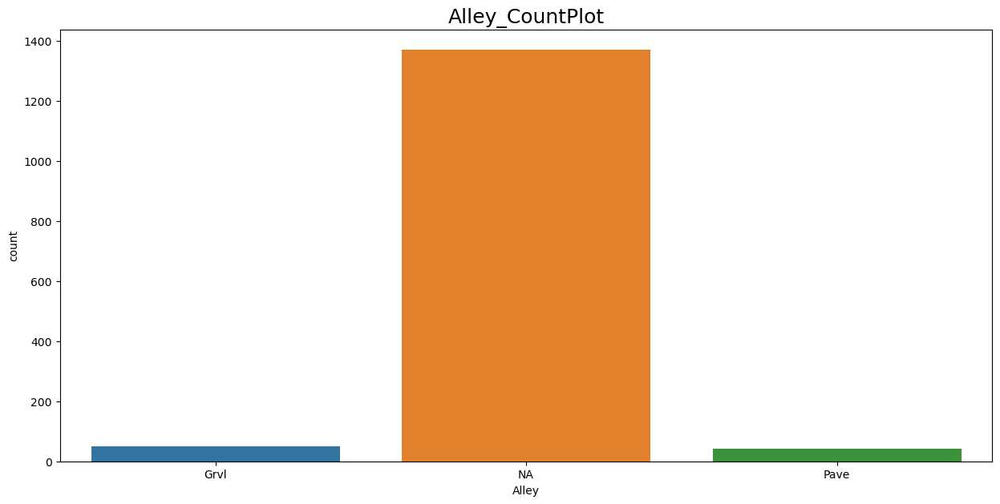

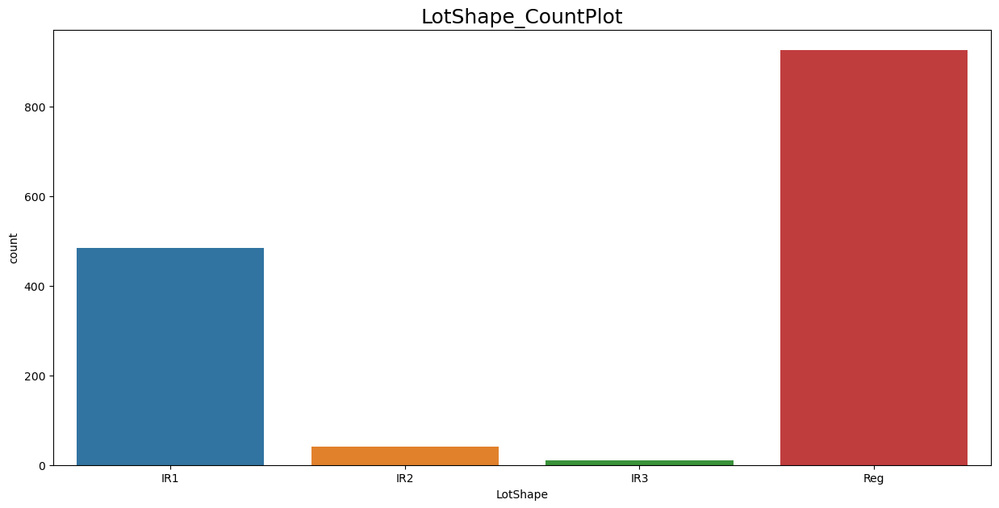

...

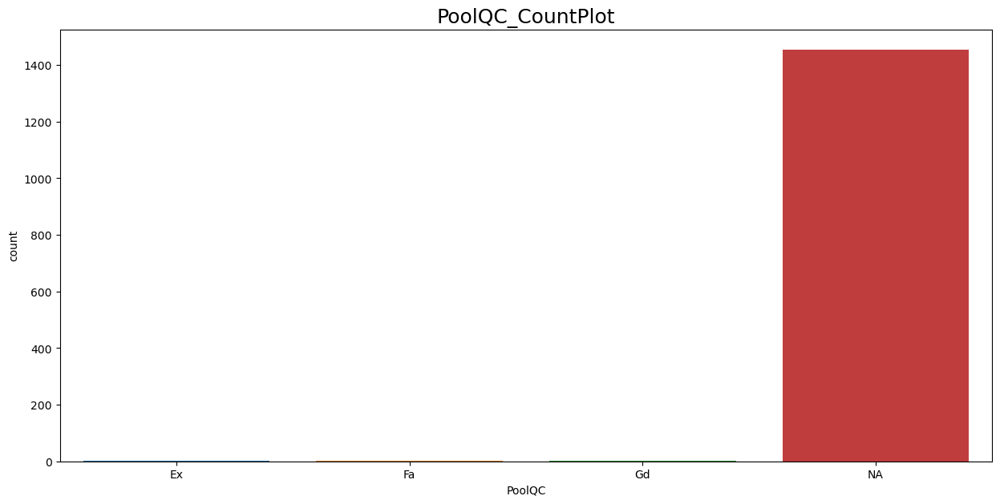

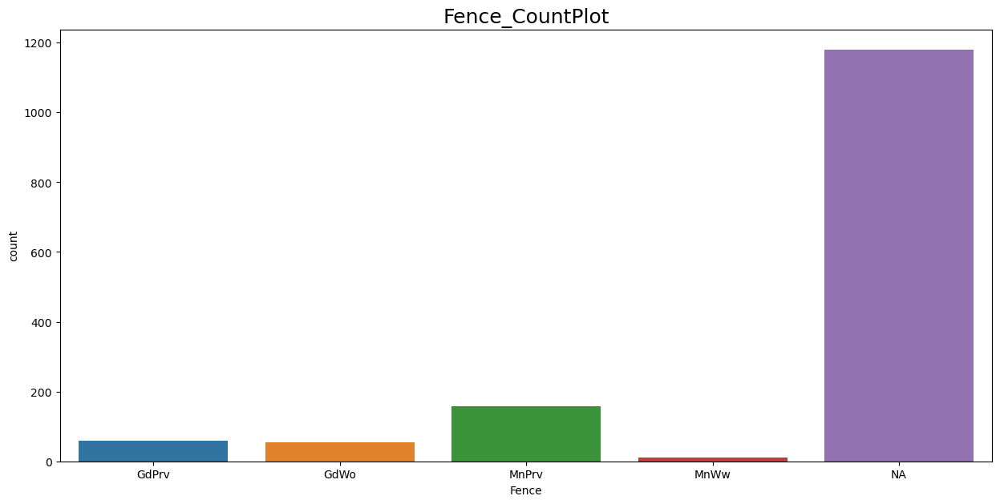

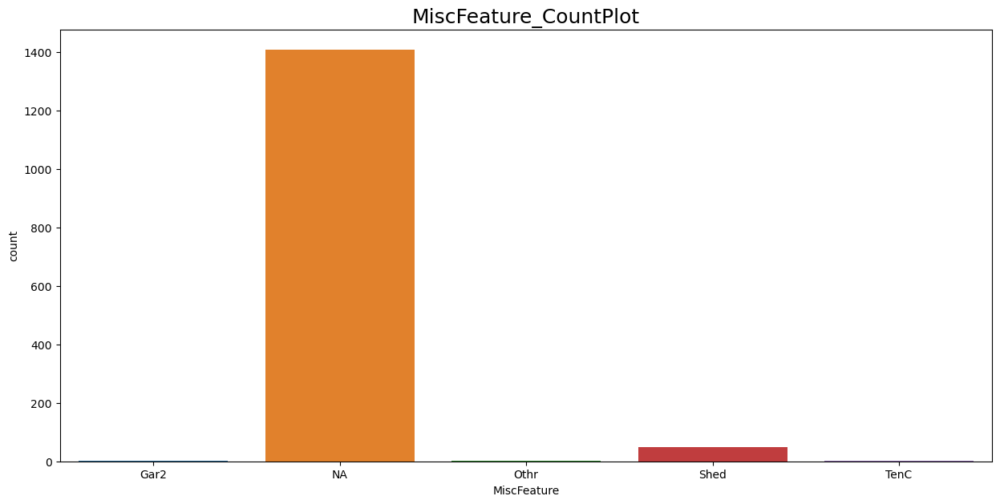

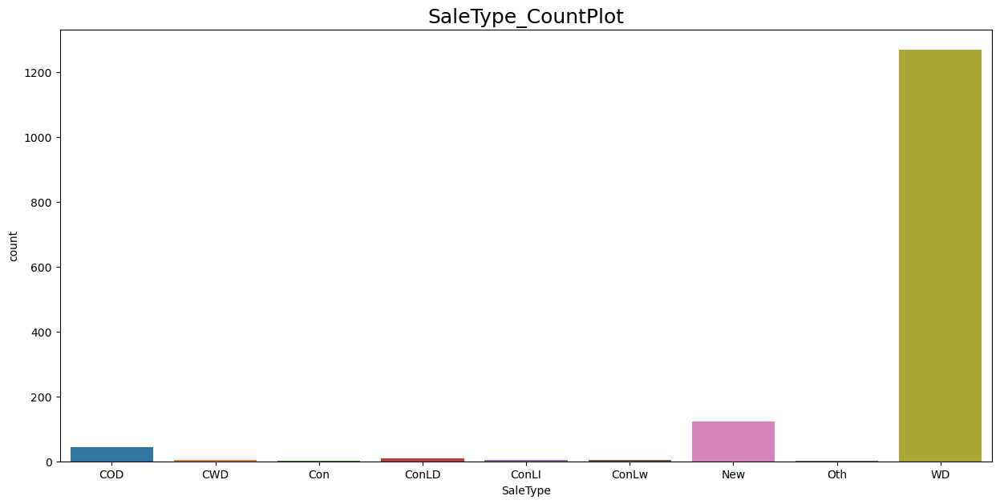

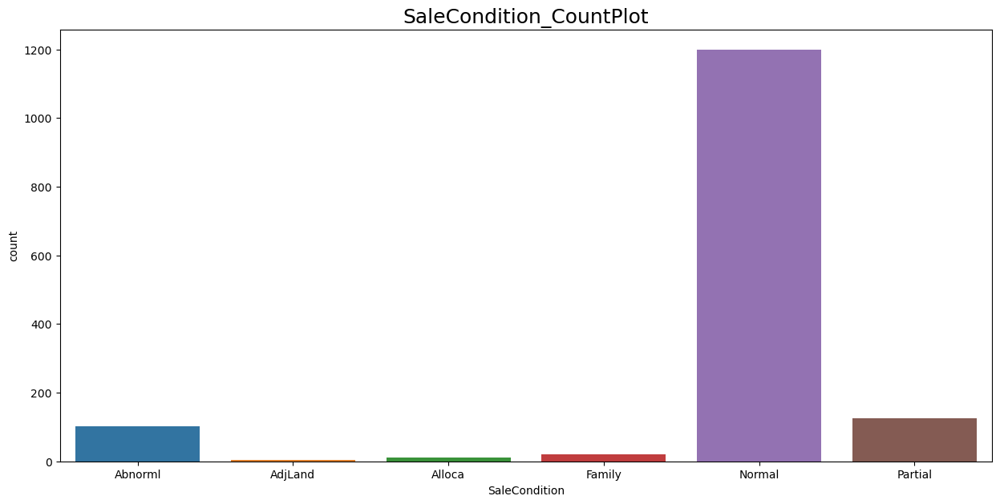

In [82]:
## Visualizing the levels of categorical columns using bar plots
# for column in category_only_columns_df.columns:
#     plt.figure(figsize=(15,7))
#     plt.title(column, fontdict={'fontsize': 12})
#     sns.countplot(x = column, data = category_only_columns_df)
#     plt.show()
  
for column in category_only_columns_df.columns:
    plt.figure(figsize=(15,7))
    plt.title(column+"_CountPlot", fontdict={'fontsize': 18})
    sns.countplot(x = column, data = category_only_columns_df)
    
    plt.show()


<p style="background-color:lightgreen;">
Categorical variables look good to proceed further with analysis
</p>

##### <p style="background-color:cyan;"> Univariate Analysis of numerical variables </p>

In [83]:
# Due to log transformation of response variable, numerical dataframe from before needs to be refreshed

numeric_only_columns_df = train_data_df.select_dtypes(include=["int64","float64"])

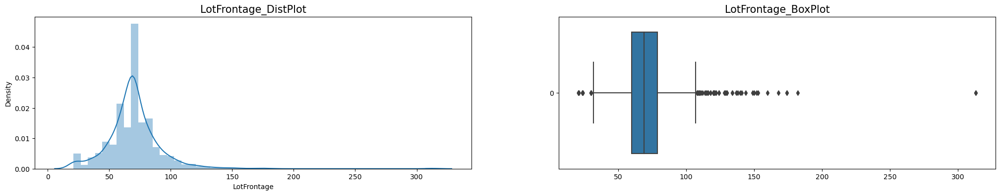

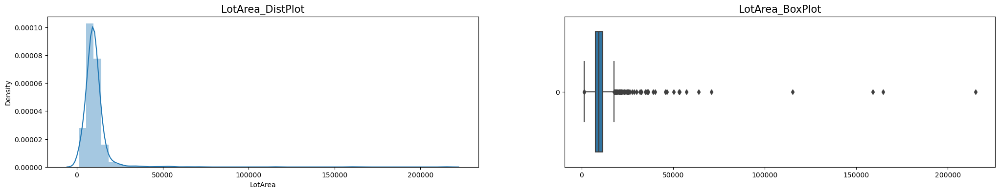

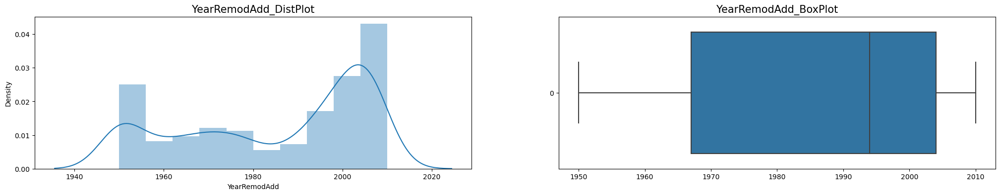

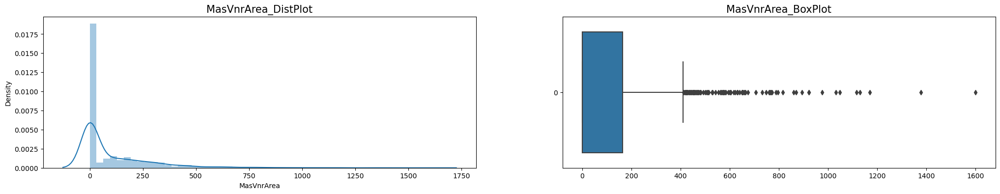

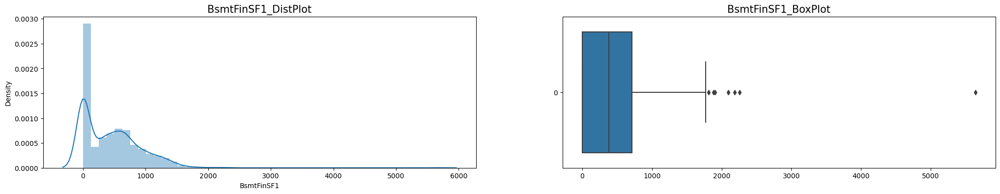

...

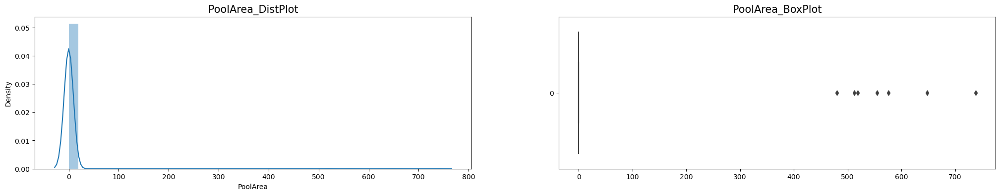

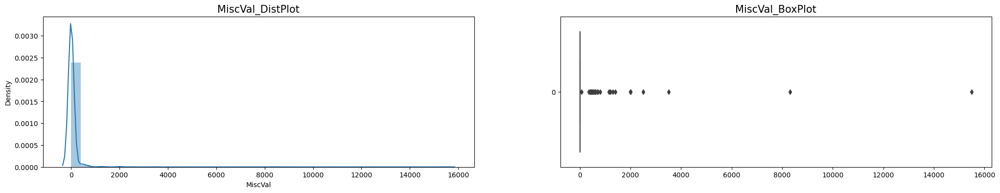

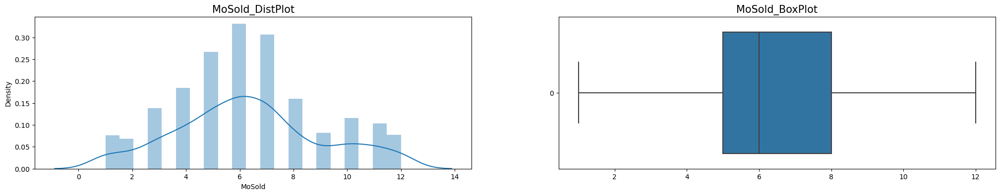

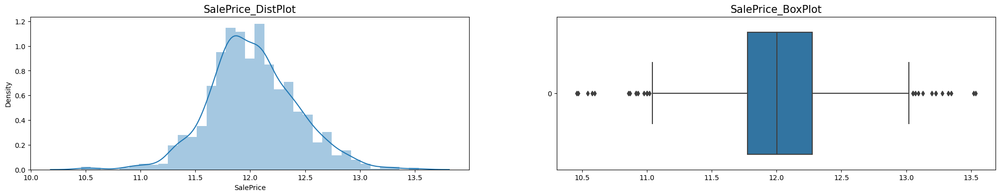

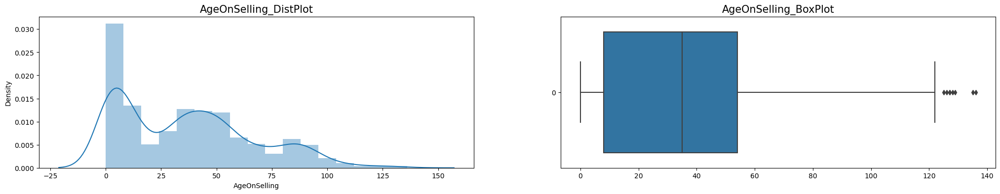

In [84]:
## View the distribution of all numeric variables using histograms and boxplots

for column in numeric_only_columns_df.columns:
    plt.figure(figsize=(25,4))
    
    plt.subplot(1,2,1)
    plt.title(column +"_DistPlot", fontdict={'fontsize': 15})
    sns.distplot(numeric_only_columns_df[column])
    
    plt.subplot(1,2,2)
    plt.title(column +"_BoxPlot", fontdict={'fontsize': 15})
    sns.boxplot(numeric_only_columns_df[column], orient="h")
    plt.show()    

<p style="background-color:lightgreen;">
1. Few Numerical variables show outliers which needs to be handled before proceeding with the analysis<br>
2. Most numerical variables have non-normal value distribution
</p>

##### <p style="background-color:skyblue;"> Outlier treatment for numerical columns </p>

In [85]:
numeric_only_columns_df.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling
0,65.00,8450,2003,196.00,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,12.25,5
1,80.00,9600,1976,0.00,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,12.11,31
2,68.00,11250,2002,162.00,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,12.32,7
3,60.00,9550,1970,0.00,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,11.85,91
4,84.00,14260,2000,350.00,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,12.43,8


<Axes: >

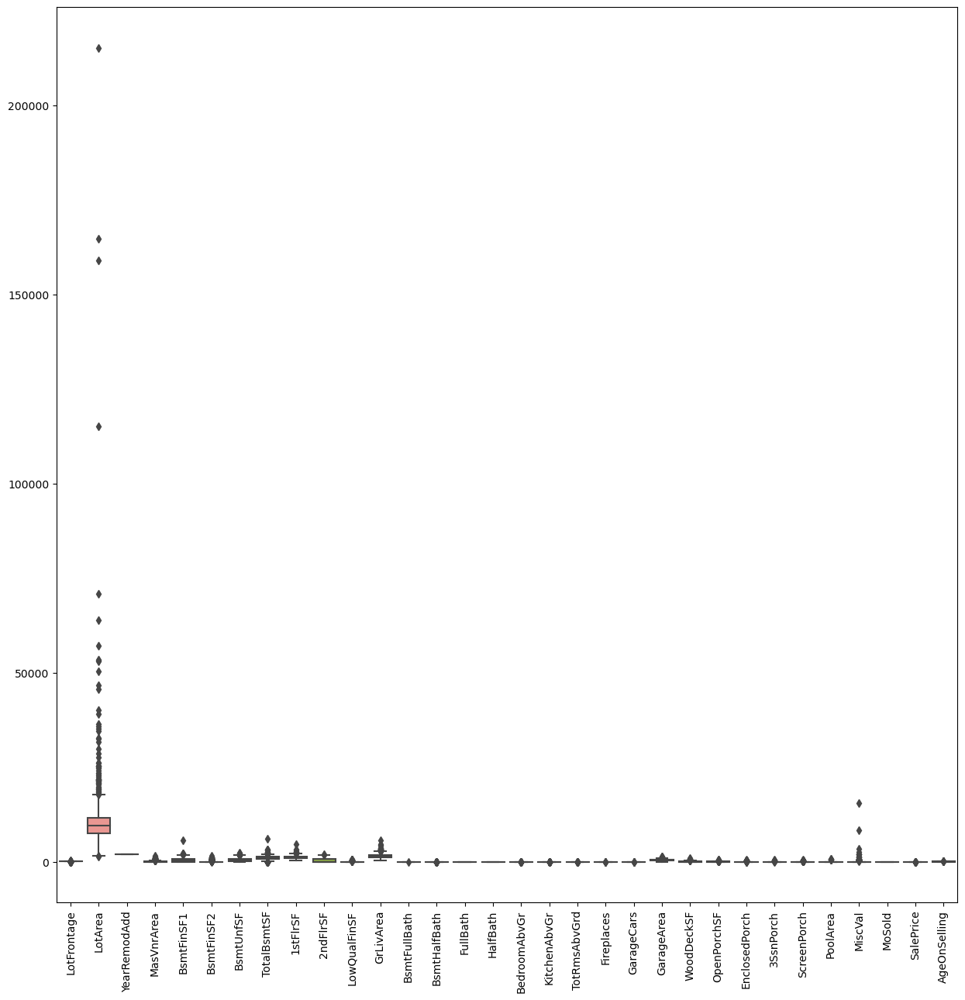

In [86]:
# BoxPlot of all numerical variables at once

plt.figure(figsize=[15,15])
plt.xticks(rotation=90)
sns.boxplot(data=numeric_only_columns_df)

In [87]:
numeric_only_columns_df.describe()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling
count,"1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00"
mean,69.86,"10,516.83","1,984.87",103.69,443.64,46.55,567.24,"1,057.43","1,162.63",346.99,5.84,"1,515.46",0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,12.02,36.55
std,22.03,"9,981.26",20.65,180.57,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,0.40,30.25
min,21.00,"1,300.00","1,950.00",0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,10.46,0.00
25%,60.00,"7,553.50","1,967.00",0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,"1,129.50",0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,11.78,8.00
50%,69.00,"9,478.50","1,994.00",0.00,383.50,0.00,477.50,991.50,"1,087.00",0.00,0.00,"1,464.00",0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,12.00,35.00
75%,79.00,"11,601.50","2,004.00",164.25,712.25,0.00,808.00,"1,298.25","1,391.25",728.00,0.00,"1,776.75",1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,12.27,54.00
max,313.00,"215,245.00","2,010.00","1,600.00","5,644.00","1,474.00","2,336.00","6,110.00","4,692.00","2,065.00",572.00,"5,642.00",3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,4.00,"1,418.00",857.00,547.00,552.00,508.00,480.00,738.00,"15,500.00",12.00,13.53,136.00


In [88]:
# Capping outliers on the upper bound to 95% and lower bound at 5%

for column in numeric_only_columns_df.columns:
    numeric_only_columns_df[column][numeric_only_columns_df[column] <= numeric_only_columns_df[column].quantile(0.03)] = numeric_only_columns_df[column].quantile(0.03)
    numeric_only_columns_df[column][numeric_only_columns_df[column] >= numeric_only_columns_df[column].quantile(0.97)] = numeric_only_columns_df[column].quantile(0.97)

In [89]:
numeric_only_columns_df.describe()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling
count,"1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00","1,460.00"
mean,69.26,"9,812.37","1,984.84",97.10,434.98,39.15,561.38,"1,054.13","1,155.83",341.86,0.00,"1,503.78",0.41,0.06,1.55,0.37,2.84,1.05,6.50,0.61,1.76,469.56,90.90,44.43,20.58,0.00,12.91,0.00,13.98,6.32,12.03,36.18
std,17.86,"3,943.72",20.62,153.13,420.52,124.28,425.71,373.64,349.15,423.61,0.00,469.19,0.49,0.23,0.50,0.48,0.74,0.21,1.52,0.63,0.74,204.74,114.20,57.35,55.16,0.00,45.19,0.00,73.31,2.70,0.37,29.36
min,30.00,"2,522.00","1,950.00",0.00,0.00,0.00,0.00,312.33,625.00,0.00,0.00,796.00,0.00,0.00,1.00,0.00,1.00,1.00,4.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,11.31,0.00
25%,60.00,"7,553.50","1,967.00",0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,"1,129.50",0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,11.78,8.00
50%,69.00,"9,478.50","1,994.00",0.00,383.50,0.00,477.50,991.50,"1,087.00",0.00,0.00,"1,464.00",0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,12.00,35.00
75%,79.00,"11,601.50","2,004.00",164.25,712.25,0.00,808.00,"1,298.25","1,391.25",728.00,0.00,"1,776.75",1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,12.27,54.00
max,114.00,"21,571.80","2,008.00",573.69,"1,375.99",546.23,"1,589.38","1,905.46","1,981.61","1,245.53",0.00,"2,633.23",1.00,1.00,2.00,1.00,4.00,2.00,10.00,2.00,3.00,884.00,385.38,213.23,216.00,0.00,192.00,0.00,400.00,12.00,12.83,97.00


<p style="background-color:lightgreen;">
    Outlier handling of numeric columns complete
</p>

##### <p style="background-color:skyblue;"> Dummy encoding categorical columns </p>

In [90]:
train_data_dummy_df = pd.get_dummies(category_only_columns_df, drop_first=True)
print("Shape of hot encoded dataframe: {}".format(train_data_dummy_df.shape))
train_data_dummy_df.head(15)

Shape of hot encoded dataframe: (1460, 353)


,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBlt_1918,GarageYrBlt_1920,GarageYrBlt_1921,GarageYrBlt_1922,GarageYrBlt_1923,GarageYrBlt_1924,GarageYrBlt_1925,GarageYrBlt_1926,GarageYrBlt_1927,GarageYrBlt_1928,GarageYrBlt_1929,GarageYrBlt_1930,GarageYrBlt_1931,GarageYrBlt_1932,GarageYrBlt_1933,GarageYrBlt_1934,GarageYrBlt_1935,GarageYrBlt_1936,GarageYrBlt_1937,GarageYrBlt_1938,GarageYrBlt_1939,Gara

##### <p style="background-color:skyblue;"> Bi-Variate analysis on categorical columns versus the response variable </p>

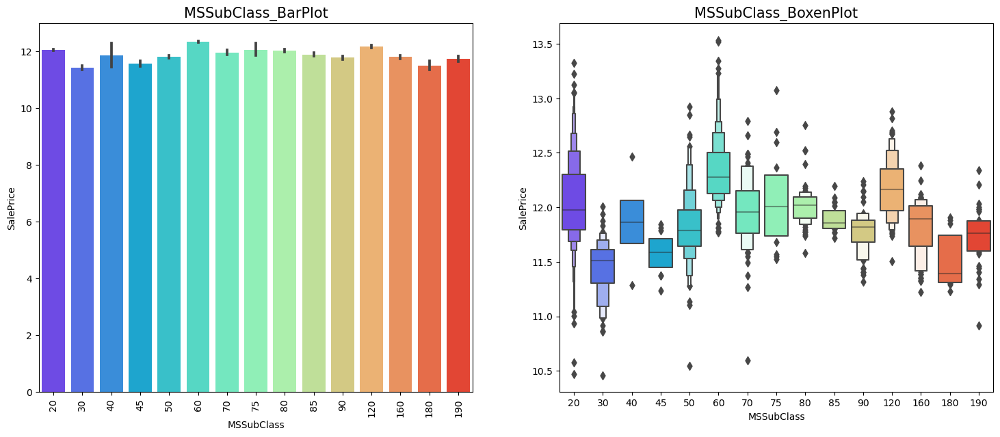

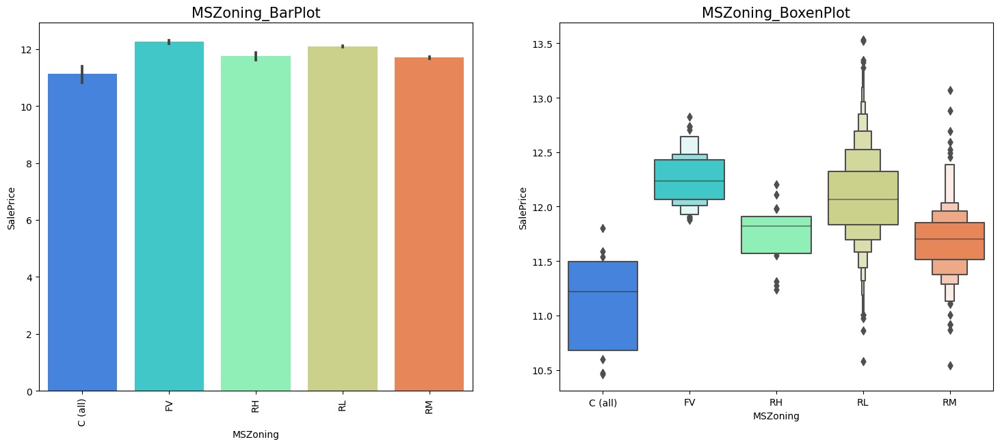

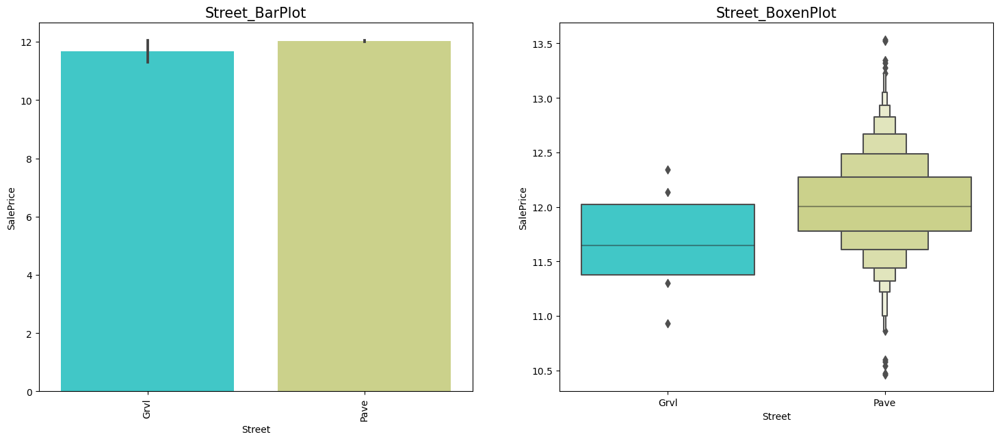

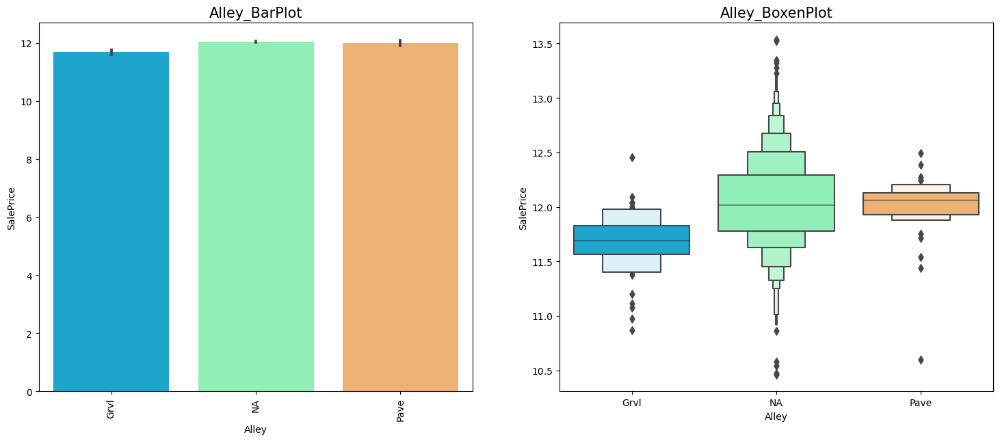

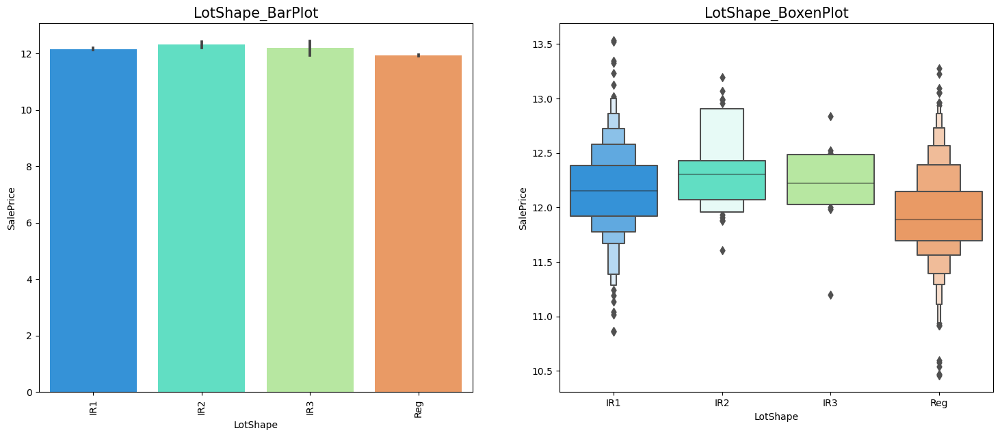

...

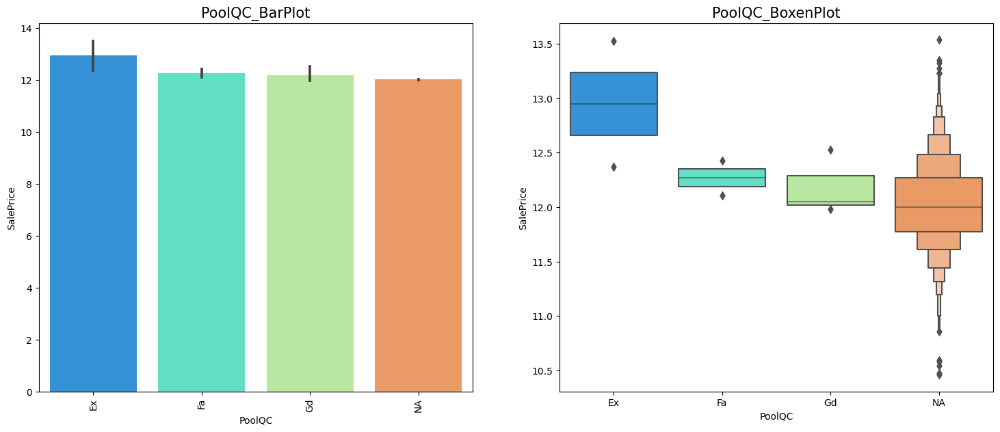

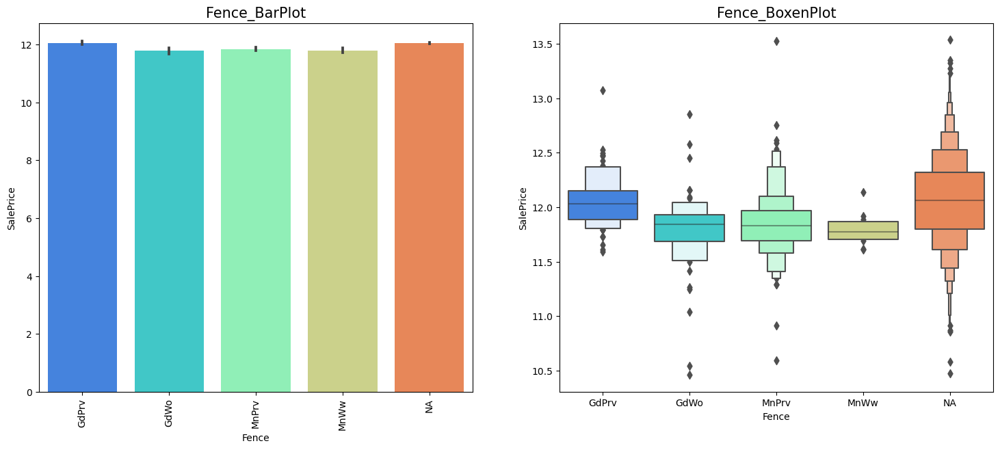

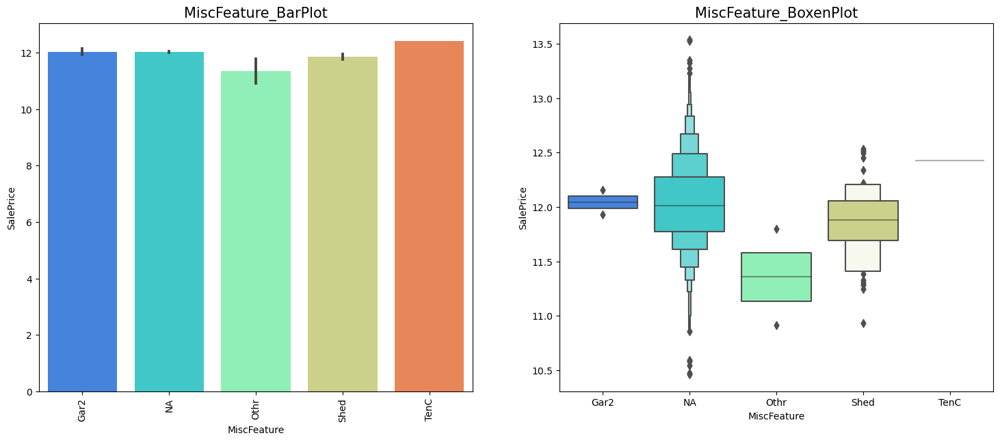

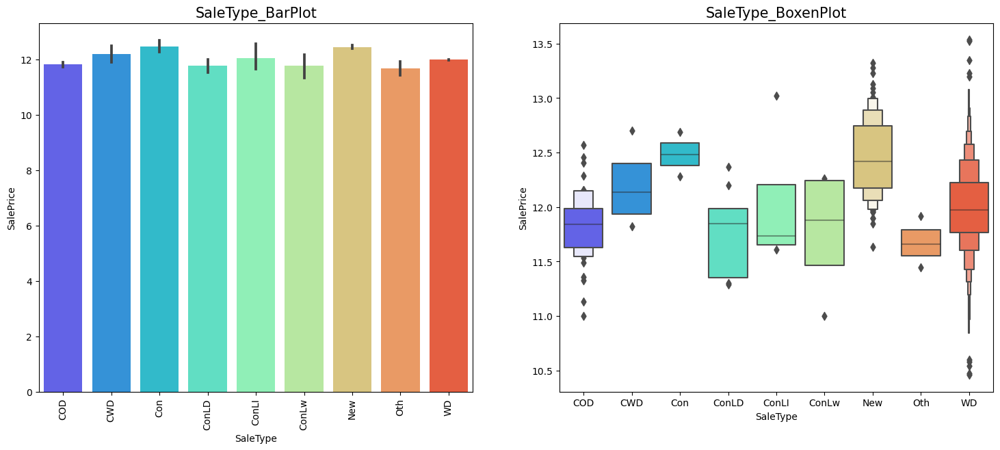

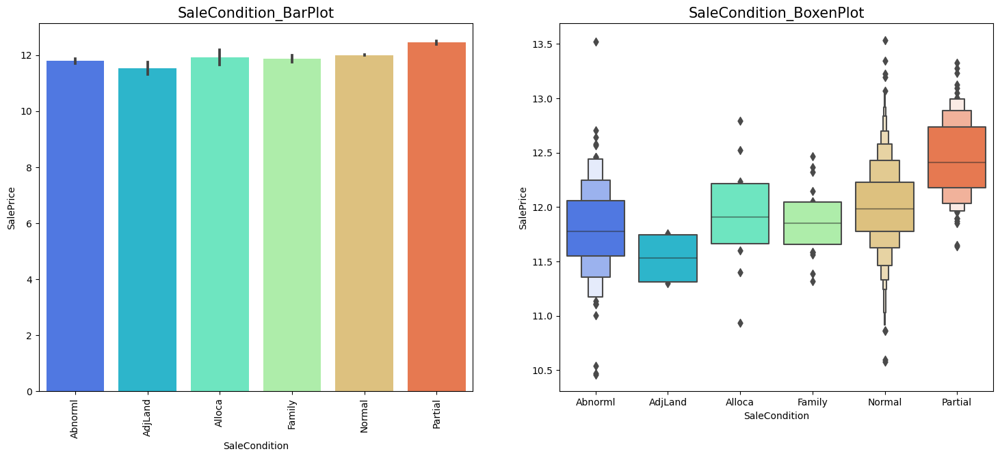

In [91]:
for column in category_only_columns_df.columns:
    plt.figure(figsize=(18,7))
    
    plt.subplot(1,2,1)
    plt.title(column +"_BarPlot", fontdict={'fontsize': 15})
    plt.xticks(rotation=90)
    sns.barplot(y=train_data_df["SalePrice"], x=column, data=category_only_columns_df, palette='rainbow')
    
    plt.subplot(1,2,2)
    plt.title(column +"_BoxenPlot", fontdict={'fontsize': 15})
    sns.boxenplot(y=train_data_df["SalePrice"], x=column, data=category_only_columns_df, palette='rainbow')
    plt.show()   

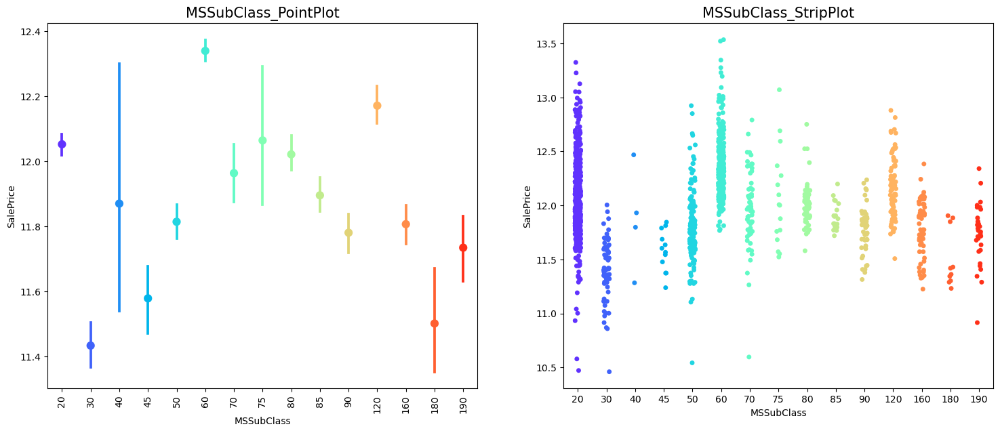

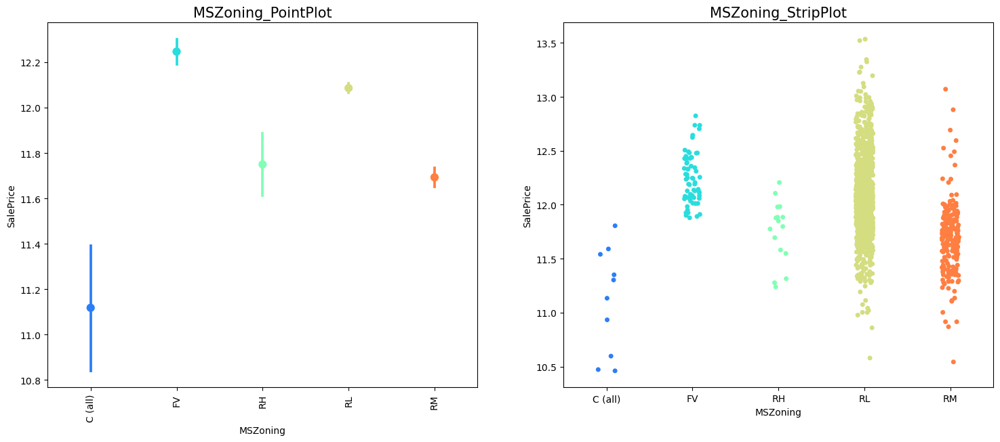

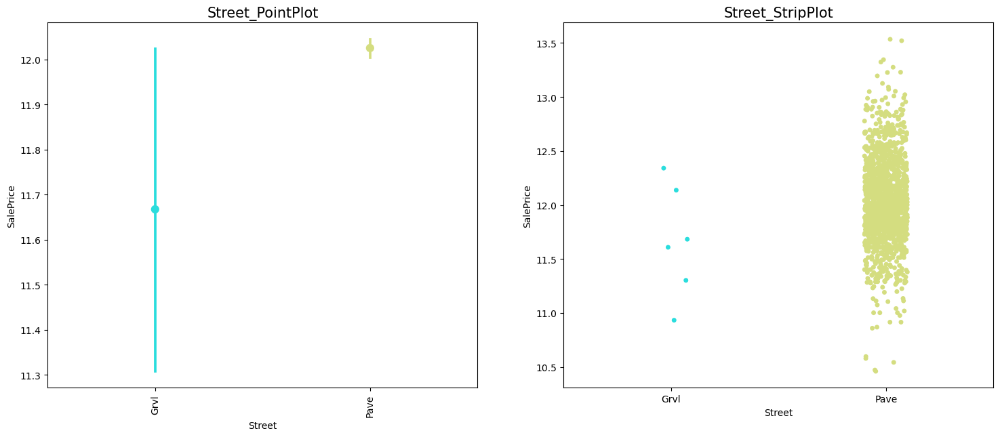

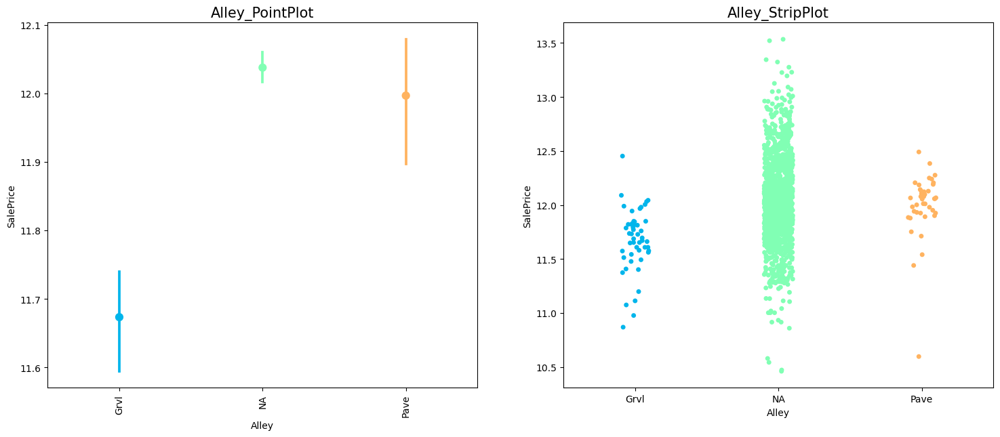

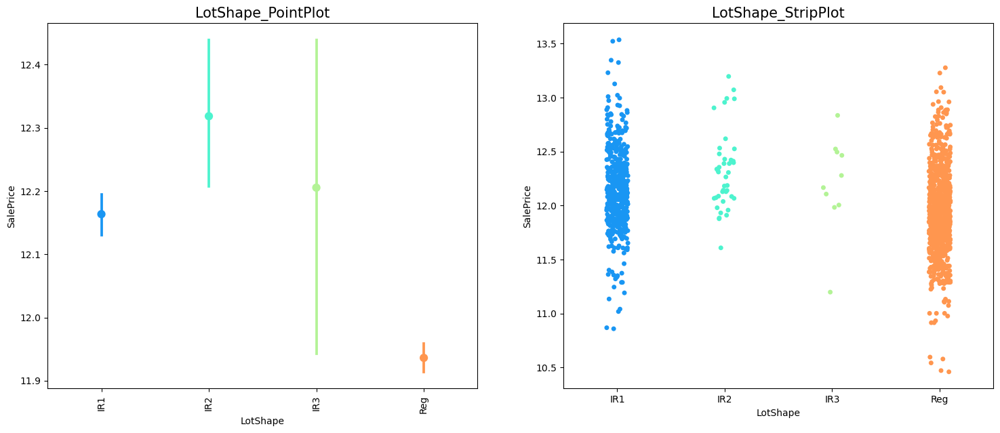

...

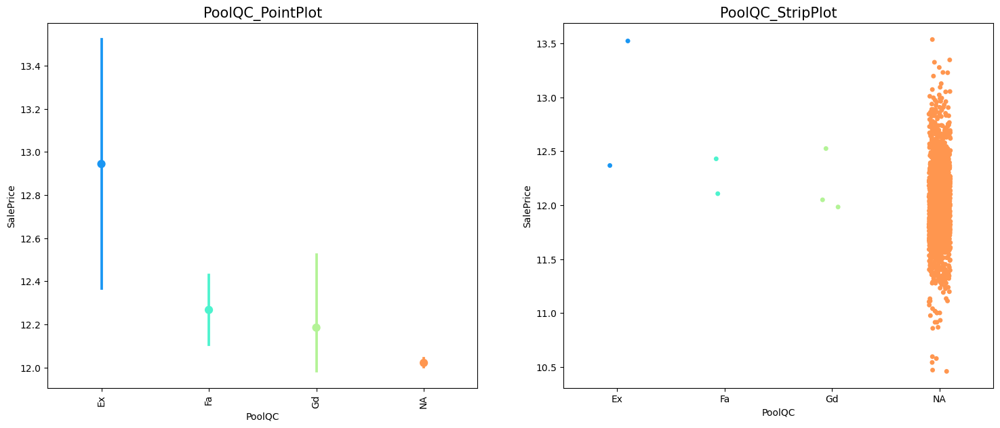

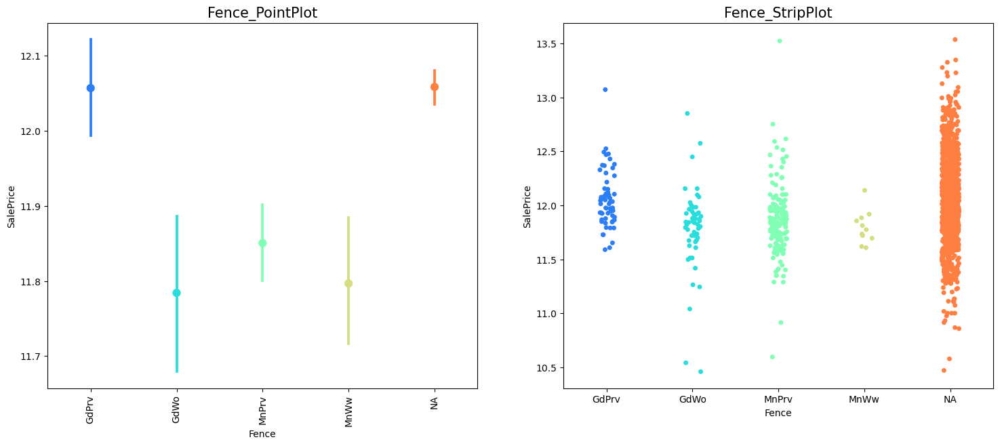

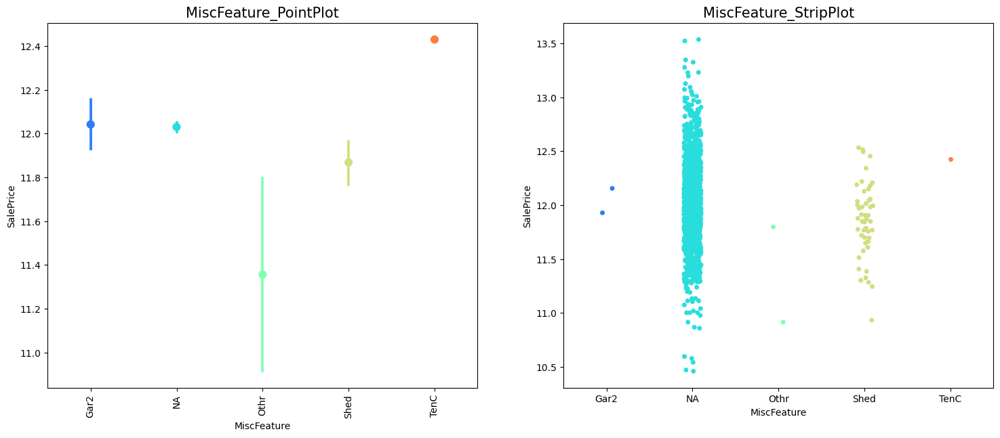

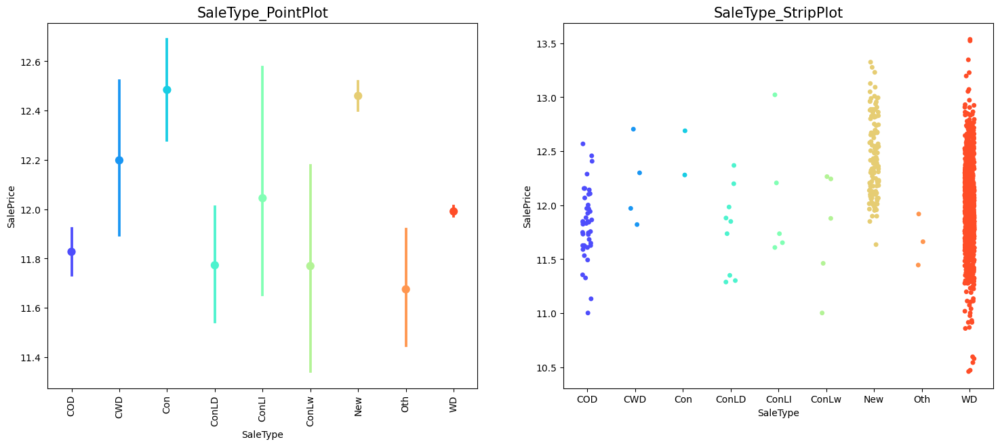

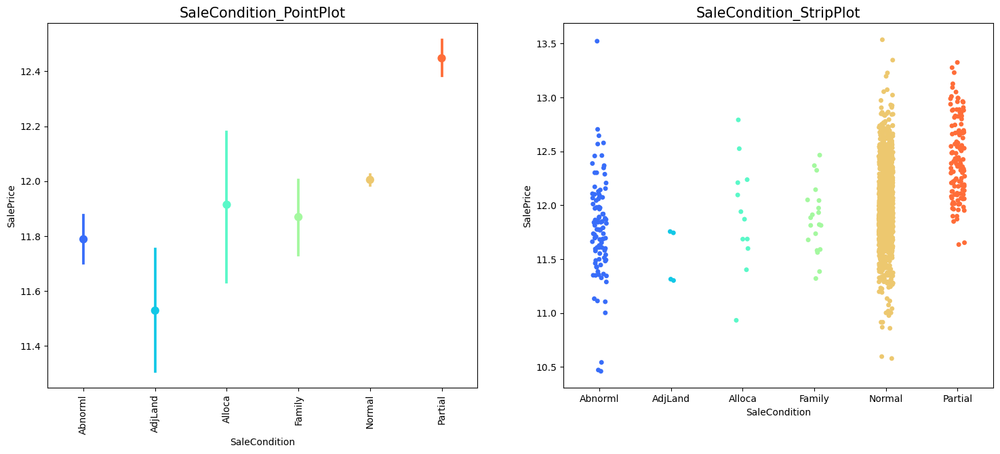

In [92]:
for column in category_only_columns_df.columns:
    plt.figure(figsize=(18,7))
    
    plt.subplot(1,2,1)
    plt.title(column +"_PointPlot", fontdict={'fontsize': 15})
    plt.xticks(rotation=90)
    sns.pointplot(y=train_data_df["SalePrice"], x=column, data=category_only_columns_df, palette='rainbow')
    
    plt.subplot(1,2,2)
    plt.title(column +"_StripPlot", fontdict={'fontsize': 15})
    sns.stripplot(y=train_data_df["SalePrice"], x=column, data=category_only_columns_df, palette='rainbow')
    plt.show()   

In [93]:
# Add dummy encoded dataframe to the original dataframe

final_df = pd.concat([numeric_only_columns_df, train_data_dummy_df], axis=1)
final_df.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBl

In [94]:
final_df.shape

(1460, 385)

In [95]:
print(final_df.columns.tolist())

['LotFrontage', 'LotArea', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'SalePrice', 'AgeOnSelling', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_180', 'MSSubClass_190', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Pave', 'Alley_NA', 'Alley_Pave', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'Utilities_NoSeWa', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'LandSlop

In [96]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 385 entries, LotFrontage to SaleCondition_Partial
dtypes: float64(13), int64(19), uint8(353)
memory usage: 868.4 KB


In [97]:
final_df.describe()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,AgeOnSelling,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBl

## <font color = orange> <strong> <center> <u> MODEL BUILDING </u> </center> </strong> </font>

##### <p style="background-color:skyblue;"> Building a Linear Regression Model (StatsModel) </p>

In [98]:
scaler = StandardScaler()

numeric_columns = numeric_only_columns_df.columns

final_df[numeric_columns] = scaler.fit_transform(final_df[numeric_columns])

In [99]:
# y = final_df.pop("SalePrice")
# X = final_df

X = final_df.drop('SalePrice', axis=1)
y = final_df["SalePrice"]

In [100]:
y.head(15)

0     0.60
1     0.23
2     0.79
3    -0.48
4     1.09
5    -0.42
6     1.65
7     0.49
8    -0.68
9    -0.94
10   -0.69
11    1.97
12   -0.40
13    1.40
14   -0.17
Name: SalePrice, dtype: float64

In [101]:
X.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,AgeOnSelling,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBlt_1918,Gar

In [102]:
print(X.columns.tolist())

['LotFrontage', 'LotArea', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'AgeOnSelling', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90', 'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_180', 'MSSubClass_190', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Pave', 'Alley_NA', 'Alley_Pave', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'Utilities_NoSeWa', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'LandSlope_Mod', 'Land

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=42, shuffle=True)

In [104]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       ...
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth',
       'SaleType_WD', 'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=384)

In [105]:
# Add constant to X dataframe
X_lm = sm.add_constant(X_train)

In [106]:
# Fit a model
lr = sm.OLS(y_train,X_lm).fit()

In [107]:
# Check the parameter
lr.params

const                   -6.95
LotFrontage              0.02
LotArea                  0.04
YearRemodAdd             0.05
MasVnrArea              -0.00
BsmtFinSF1              -0.09
BsmtFinSF2              -0.05
BsmtUnfSF               -0.17
TotalBsmtSF              0.26
1stFlrSF                -0.06
2ndFlrSF                 0.01
LowQualFinSF             0.00
GrLivArea                0.36
BsmtFullBath             0.02
BsmtHalfBath            -0.00
FullBath                 0.02
HalfBath                 0.03
BedroomAbvGr             0.03
KitchenAbvGr            -0.02
TotRmsAbvGrd            -0.00
Fireplaces               0.05
GarageCars               0.04
GarageArea               0.06
WoodDeckSF               0.03
OpenPorchSF              0.02
EnclosedPorch            0.02
3SsnPorch               -0.00
ScreenPorch              0.02
PoolArea                -0.00
MiscVal                  0.84
MoSold                   0.01
AgeOnSelling            -0.15
MSSubClass_30           -0.15
MSSubClass

In [108]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     42.77
Date:                Wed, 20 Sep 2023   Prob (F-statistic):          1.01e-319
Time:                        23:52:20   Log-Likelihood:                 183.26
No. Observations:                1021   AIC:                             353.5
Df Residuals:                     661   BIC:                             2128.
Df Model:                         359                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -6.94

In [109]:
# # Create a dataframe for holding VIF values
vif_df = pd.DataFrame()

vif_df["Variables"] = X_train.columns
vif_df["VIF"] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif_df["VIF"] = round(vif_df["VIF"],2)
vif_df = vif_df.sort_values(by = "VIF", ascending=False)

vif_df

,Variables,VIF
210,BsmtFinType2_NA,inf
40,MSSubClass_90,inf
124,OverallCond_2,inf
345,GarageFinish_NA,inf
247,GarageType_NA,inf
195,BsmtCond_Po,inf
199,BsmtExposure_NA,inf
107,BldgType_TwnhsE,inf
106,BldgType_Twnhs,inf
41,MSSubClass_120,inf


##### <p style="background-color:skyblue;"> Building a Linear Regression Model (RFE) </p>

In [110]:
X_rfe = final_df.drop("SalePrice", axis=1)
y_rfe = final_df["SalePrice"]

In [111]:
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(X_rfe, y_rfe, test_size=0.2, random_state=42, shuffle=True)

In [112]:
lm = LinearRegression()
lm.fit(X_train_rfe,y_train_rfe)

LinearRegression()

In [113]:
rfe = RFE(lm,n_features_to_select=150)
rfe = rfe.fit(X_train_rfe,y_train_rfe)

In [114]:
list(zip(X_train_rfe.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 195),
 ('LotArea', False, 50),
 ('YearRemodAdd', False, 75),
 ('MasVnrArea', False, 216),
 ('BsmtFinSF1', False, 142),
 ('BsmtFinSF2', False, 143),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', False, 134),
 ('2ndFlrSF', False, 230),
 ('LowQualFinSF', False, 186),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 152),
 ('BsmtHalfBath', False, 223),
 ('FullBath', False, 161),
 ('HalfBath', False, 162),
 ('BedroomAbvGr', False, 188),
 ('KitchenAbvGr', False, 138),
 ('TotRmsAbvGrd', False, 215),
 ('Fireplaces', False, 68),
 ('GarageCars', False, 127),
 ('GarageArea', True, 1),
 ('WoodDeckSF', False, 173),
 ('OpenPorchSF', False, 180),
 ('EnclosedPorch', False, 211),
 ('3SsnPorch', False, 190),
 ('ScreenPorch', False, 174),
 ('PoolArea', False, 187),
 ('MiscVal', False, 43),
 ('MoSold', False, 224),
 ('AgeOnSelling', True, 1),
 ('MSSubClass_30', True, 1),
 ('MSSubClass_40', False, 196),
 ('MSSubClass_45', True, 1),
 ('MSSubClass_50', False, 155)

In [115]:
selected_150_columns_rfe = X_train_rfe.columns[rfe.support_]
print(selected_150_columns_rfe.tolist())

['BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 'AgeOnSelling', 'MSSubClass_30', 'MSSubClass_45', 'MSSubClass_80', 'MSSubClass_90', 'MSSubClass_160', 'MSSubClass_180', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'LotShape_IR3', 'Utilities_NoSeWa', 'LandSlope_Sev', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker', 'Condition1_Feedr', 'Condition1_Norm', 'Condition1_PosA', 'Condition1_PosN', 'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn', 'Condition2_Feedr', 'Condition2_Norm', 'Condition2_PosA', 'Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn', 'BldgType_Duplex', 'BldgType_Twnhs', 'HouseStyle_1.5Unf', 'HouseStyle_SLvl', 'OverallQual_2', 'OverallQual_4', 'OverallQual_7', 'OverallQual_8', 'OverallQual_9', 'Overall

In [116]:
X_train_rfe.columns[rfe.support_]

Index(['BsmtUnfSF', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 'AgeOnSelling',
       'MSSubClass_30', 'MSSubClass_45', 'MSSubClass_80', 'MSSubClass_90',
       'MSSubClass_160',
       ...
       'GarageCond_Po', 'GarageCond_TA', 'PoolQC_NA', 'MiscFeature_TenC',
       'SaleType_Con', 'SaleType_New', 'SaleType_Oth', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Normal'],
      dtype='object', length=150)

In [117]:
# Build StatsModel using RFE selected variables
X_train_rfe2 = X_train_rfe[selected_150_columns_rfe]

In [118]:
X_train_rfe2 = sm.add_constant(X_train_rfe2)

In [119]:
lm = sm.OLS(y_train_rfe, X_train_rfe2).fit()

In [120]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     114.0
Date:                Wed, 20 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:53:08   Log-Likelihood:                 6.9844
No. Observations:                1168   AIC:                             274.0
Df Residuals:                    1024   BIC:                             1003.
Df Model:                         143                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -4.8771      0.438    -11.134      0.000      -5.737      -4.018
BsmtUnfSF                -0.1058      0.010    -11.003      0.000      -0.125      -0.087
TotalBsmtSF               0.2133      0.013     16.679      0.000       0.188       0.238
GrLivArea                 0.3980      0.012     33.461      0.000       0.375       0.421
GarageArea                0.0876      0.014      6.386      0.000       0.061       0.114
AgeOnSelling             -0.2630      0.022    -12.069      0.000      -0.306      -0.220
MSSubClass_30            -0.1602      0.048     -3.304      0.001      -0.255      -0.065
MSSubClass_45            -0.6911      0.268     -2.578      0.010      -1.217      -0.165
MSSubClass_80            -0.1579      0.129     -1.226      0.221      -0.411       0.095
MSSubClass_90            -0.2197      0.026     -8.293      0.000      -0.272      -0.168
MSSubClass_160           -0.2659      0.059     -4.475      0.000      -0.382      -0.149
MSSubClass_180           -0.3080      0.137     -2.254      0.024      -0.576      -0.040
MSZoning_FV               0.3955      0.060      6.560      0.000       0.277       0.514
MSZoning_RH               0.1730      0.087      1.992      0.047       0.003       0.343
MSZoning_RL               0.2133      0.045      4.714      0.000       0.124       0.302
LotShape_IR3              0.2017      0.102      1.975      0.049       0.001       0.402
Utilities_NoSeWa         -0.3776      0.294     -1.284      0.199      -0.955       0.199
LandSlope_Sev             0.2364      0.113      2.085      0.037       0.014       0.459
Neighborhood_BrDale       0.1133      0.101      1.123      0.262      -0.085       0.311
Neighborhood_BrkSide      0.1732      0.056      3.099      0.002       0.064       0.283
Neighborhood_ClearCr      0.2189      0.072      3.040      0.002       0.078       0.360
Neighborhood_Crawfor      0.4110      0.049      8.401      0.000       0.315       0.507
Neighborhood_IDOTRR       0.2554      0.078      3.256      0.001       0.101       0.409
Neighborhood_MeadowV     -0.2467      0.108     -2.291      0.022      -0.458      -0.035
Neighborhood_NoRidge      0.1652      0.054      3.034      0.002       0.058       0.272
Neighborhood_NridgHt      0.1424      0.046      3.089      0.002       0.052       0.233
Neighborhood_OldTown      0.1375      0.061      2.258      0.024       0.018       0.257
Neighborhood_SWISU        0.1814      0.073      2.489      0.013       0.038       0.324
Neighborhood_StoneBr      0.2360      0.066      3.581      0.000       0.107       0.365
Neighborhood_Timber       0.1525      0.056      2.740      0.006       0.043       0.262
Neighborhood_Veenker      0.2046      0.097      2.108      0.035       0.014       0.395
Condition1_Feedr       

##### <p style="background-color:skyblue;"> Building a Ridge Regression Model </p>

In [121]:
# Preparing the X and y dataset

X_ridge = final_df.drop("SalePrice", axis=1)
y_ridge = final_df["SalePrice"]

In [122]:
X_train_ridge, X_test_ridge, y_train_ridge, y_test_ridge = train_test_split(X_ridge, y_ridge,
                                                                            train_size=0.7, test_size=0.3,
                                                                            random_state=42, shuffle=True)

In [123]:
## View dimensions of train data
print(X_train_ridge.shape)
print(y_train_ridge.shape)

(1021, 384)
(1021,)


In [124]:
## View dimensions of test data
print(X_test_ridge.shape)
print(y_test_ridge.shape)

(438, 384)
(438,)


In [125]:
# Define a list of alpha values for ridge regression modelc reation

parameters_ridge = {"alpha": [0.0001, 0.001, 0.01, 0.03, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6, 0.7,
                    0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10, 15, 20, 25, 30, 35, 40, 45, 50,
                    100, 500, 1000]}

In [126]:
ridge = Ridge()

# Prepare for cross validation
ridgeCV = GridSearchCV(estimator = ridge, 
                       param_grid = parameters_ridge, 
                       scoring= 'neg_mean_absolute_error',
                       cv = 5,
                       return_train_score=True,
                       verbose = 1)

In [127]:
# Fit for ridge cross validation
ridgeCV.fit(X_train, y_train) 

Fitting 5 folds for each of 39 candidates, totalling 195 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.03, 0.05, 0.1, 0.15,
                                   0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6,
                                   0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0,
                                   7.0, 8.0, 9.0, 10, 15, 20, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [128]:
# Fetch optimal value for ridge regression model

print(Fore.GREEN + "Optimal value for ridge regression: {}".format(ridgeCV.best_params_))

Optimal value for ridge regression: {'alpha': 9.0}


In [129]:
# Analyse cross validation results for ridge regression
ridgeCV.cv_results_

{'mean_fit_time': array([0.01180797, 0.01162238, 0.01226058, 0.01185098, 0.01103172,
        0.01348262, 0.01215563, 0.01131496, 0.01103683, 0.01099672,
        0.01394448, 0.01226811, 0.01361246, 0.01120248, 0.01113524,
        0.01179447, 0.01780782, 0.01661878, 0.01212096, 0.01177163,
        0.0116538 , 0.01222081, 0.01125302, 0.0111311 , 0.01175656,
        0.01161652, 0.01210241, 0.01159358, 0.0113646 , 0.01178036,
        0.01157069, 0.01134949, 0.01089387, 0.01103086, 0.01084881,
        0.01124101, 0.01130977, 0.01451216, 0.01231084]),
 'std_fit_time': array([1.38571469e-03, 1.01760671e-03, 1.08984785e-03, 9.03134683e-04,
        1.82328500e-04, 2.36432446e-03, 1.20586183e-03, 4.85858612e-04,
        3.37742867e-04, 1.26565248e-04, 4.41898406e-03, 1.03659479e-03,
        1.54409253e-03, 2.36515297e-04, 2.15213551e-04, 4.77830915e-04,
        1.25811376e-02, 4.06226125e-03, 5.53385392e-04, 5.42008936e-04,
        7.71312611e-04, 1.87174552e-03, 3.00209555e-04, 1.76032780e-04,
 

Thus, we get optimum value of alpha as 10. Now we will build a ridge regression model using this value.

In [130]:
# Create a ridge regresion with optimal value of alpha as 10
ridge = Ridge(alpha=10)

In [131]:
# Fit the model on training data
ridge.fit(X_train_ridge, y_train_ridge)

Ridge(alpha=10)

In [132]:
# Check the co-efficients for ridge regression model
ridge.coef_

array([ 1.58965410e-02,  4.88423390e-02,  6.92154357e-02, -6.74710629e-03,
        1.91647578e-02, -1.58881323e-03, -6.25675359e-02,  1.54094901e-01,
        4.14642747e-02,  9.30582785e-02,  0.00000000e+00,  2.34591034e-01,
        1.87181826e-02, -3.87448796e-03,  4.55311967e-02,  3.40530368e-02,
        2.34124469e-02, -7.11755316e-02,  1.29171611e-02,  5.67553112e-02,
        7.90816755e-02,  2.17420556e-02,  3.16513861e-02,  1.84942703e-02,
        1.51339498e-02,  0.00000000e+00,  3.03427465e-02,  0.00000000e+00,
        1.25172675e-03,  5.25368906e-03, -1.32682569e-01, -1.04561143e-01,
        8.69029085e-03,  4.14595045e-03, -9.64855121e-03, -4.34483631e-02,
        8.65914665e-02,  5.80109333e-02, -6.54673393e-03,  3.00189794e-02,
       -3.93585818e-03,  3.15071718e-03, -1.49575280e-01, -1.21017949e-02,
        1.59301649e-02,  9.93305704e-02,  1.73695530e-02,  4.69519912e-02,
       -7.00737284e-02,  1.30375127e-02, -3.23123915e-02,  8.88556703e-02,
        4.37484762e-02, -

In [133]:
# Make predictions using ridge regression model
y_train_pred_ridge = ridge.predict(X_train_ridge)
y_pred_ridge = ridge.predict(X_test_ridge)

In [134]:
# Analyse metrics for ridge regression
ridge_metrics = show_metrics(y_train_ridge, y_train_pred_ridge, y_test_ridge, y_pred_ridge)

R-Squared (Train) = 0.94
R-Squared (Test) = 0.93
RSS (Train) = 59.25
RSS (Test) = 33.03
MSE (Train) = 0.06
MSE (Test) = 0.08
RMSE (Train) = 0.24
RMSE (Test) = 0.27


In [135]:
ridgeCV_results= pd.DataFrame(ridgeCV.cv_results_)
ridgeCV_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.01,0.00,0.00,0.00,0.00,{'alpha': 0.0001},-0.27,-0.29,-0.30,-0.28,-0.29,-0.28,0.01,38,-0.13,-0.13,-0.13,-0.13,-0.14,-0.13,0.00
1,0.01,0.00,0.00,0.00,0.00,{'alpha': 0.001},-0.26,-0.28,-0.29,-0.28,-0.28,-0.28,0.01,37,-0.13,-0.13,-0.13,-0.13,-0.14,-0.13,0.00
2,0.01,0.00,0.00,0.00,0.01,{'alpha': 0.01},-0.26,-0.28,-0.28,-0.27,-0.26,-0.27,0.01,36,-0.13,-0.13,-0.13,-0.13,-0.14,-0.13,0.00
3,0.01,0.00,0.00,0.00,0.03,{'alpha': 0.03},-0.25,-0.27,-0.28,-0.27,-0.25,-0.26,0.01,35,-0.14,-0.13,-0.13,-0.13,-0.14,-0.13,0.00
4,0.01,0.00,0.00,0.00,0.05,{'alpha': 0.05},-0.25,-0.27,-0.28,-0.26,-0.24,-0.26,0.01,33,-0.14,-0.13,-0.13,-0.13,-0.14,-0.13,0.00
5,0.01,0.00,0.00,0.00,0.10,{'alpha': 0.1},-0.24,-0.27,-0.27,-0.26,-0.24,-0.26,0.01,32,-0.14,-0.13,-0.14,-0.14,-0.14,-0.14,0.00
6,0.01,0.00,0.00,0.00,0.15,{'alpha': 0.15},-0.24,-0.27,-0.27,-0.26,-0.23,-0.25,0.01,31,-0.14,-0.13,-0.14,-0.14,-0.14,-0.14,0.00
7,0.01,0.00,0.00,0.00,0.20,{'alpha': 0.2},-0.23,-0.27,-0.26,-0.25,-0.23,-0.25,0.01,30,-0.14,-0.13,-0.14,-0.14,-0.14,-0.14,0.00
8,0.01,0.00,0.00,0.00,0.25,{'alpha': 0.25},-0.23,-0.27,-0.26,-0.25,-0.23,-0.25,0.01,29,-0.14,-0.13,-0.14,-0.14,-0.14,-0.14,0.00
9,0.01,0.00,0.00,0.00,0.30,{'alpha': 0.3},-0.23,-0.26,-0.26,-0.25,-0.23,-0.25,0.01,28,-0.15,-0.13,-0.14,-0.14,-0.14,-0.14,0.00


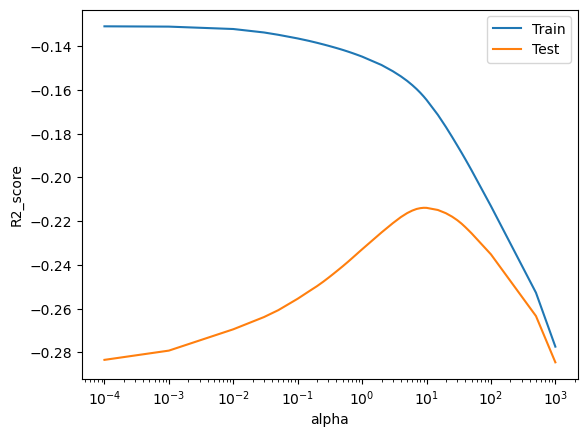

In [136]:
## Plotting R2 score vs alpha values
plt.plot(ridgeCV_results['param_alpha'], ridgeCV_results['mean_train_score'], label='Train')
plt.plot(ridgeCV_results['param_alpha'], ridgeCV_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

As the value of alpha increases, we see a decrease in train error and an initial increase followed by decrease in test error.
From graph also, it is apparent that the optimal value of alpha is 10.

##### <p style="background-color:skyblue;"> Building a Lasso Regression Model </p>

In [137]:
# Making use of the same parameter grid as we did with Ridge regression
parameters_lasso = parameters_ridge 

In [138]:
# Initialising for LASSO regression
lasso = Lasso()

In [139]:
# Performing cross validation for Lasso regression

lassoCV = GridSearchCV(estimator = lasso, 
                        param_grid = parameters_lasso, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1)

In [140]:
# Updating X and y dataset for Lasso regression

X_lasso = final_df.drop("SalePrice", axis=1)
y_lasso = final_df["SalePrice"]

X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(X_lasso, y_lasso,
                                                                            train_size=0.7, test_size=0.3,
                                                                            random_state=100)

In [141]:
## View dimensions of train data
print(X_train_lasso.shape)
print(y_train_lasso.shape)

(1021, 384)
(1021,)


In [142]:
## View dimensions of test data
print(X_test_lasso.shape)
print(y_test_lasso.shape)

(438, 384)
(438,)


In [143]:
# Fitting for Lasso regression         
lassoCV.fit(X_train_lasso, y_train_lasso)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.03, 0.05, 0.1, 0.15,
                                   0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6,
                                   0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0,
                                   7.0, 8.0, 9.0, 10, 15, 20, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [144]:
# get the optimal value for Lasso regression model
lassoCV.best_params_

{'alpha': 0.001}

In [145]:
# Analyse cross validation results for Lasso regression model
lassoCV.cv_results_

{'mean_fit_time': array([0.11170902, 0.03404927, 0.01347589, 0.01192713, 0.01221786,
        0.01165657, 0.01149821, 0.01212382, 0.01126742, 0.01094074,
        0.01104908, 0.01106496, 0.01026568, 0.00974798, 0.00897079,
        0.0084784 , 0.00914645, 0.00869932, 0.00835023, 0.00824962,
        0.00842495, 0.00837626, 0.00871491, 0.00827327, 0.00799246,
        0.0084631 , 0.00810795, 0.00817614, 0.0079319 , 0.01062274,
        0.00965991, 0.00940571, 0.00894051, 0.0089951 , 0.01178555,
        0.0141118 , 0.01055069, 0.00946746, 0.00888796]),
 'std_fit_time': array([0.0127362 , 0.0027661 , 0.00105242, 0.00112686, 0.00151518,
        0.00060616, 0.00111411, 0.00114881, 0.000524  , 0.00031526,
        0.00096479, 0.00149379, 0.00143304, 0.00108867, 0.00050518,
        0.0007645 , 0.0013445 , 0.00100627, 0.00063948, 0.00049091,
        0.00086872, 0.00058686, 0.00108108, 0.00104943, 0.00046345,
        0.00077639, 0.00074858, 0.00056457, 0.00026932, 0.00211109,
        0.00124646, 0.001

In [146]:
# Create a ridge regreesion instance with optimum value alpha=0.001
lasso = Lasso(alpha=0.001)

In [147]:
# Fit the model on training data
lasso.fit(X_train_lasso, y_train_lasso)

Lasso(alpha=0.001)

In [148]:
## View the coefficients of lasso fitted model
lasso.coef_

array([ 1.18824824e-02,  5.90015294e-02,  7.51795472e-02,  7.06405642e-03,
        2.58759834e-02, -2.50714490e-03, -4.16373347e-02,  1.76307431e-01,
        1.20659954e-02,  6.73123588e-02,  0.00000000e+00,  2.88751789e-01,
        2.54938344e-02, -5.62781009e-03,  3.69916544e-02,  2.50281230e-02,
        0.00000000e+00, -6.83061204e-02,  7.41680960e-03,  3.60980140e-02,
        3.53786142e-02,  5.24409006e-02,  3.25584154e-02,  1.55195871e-02,
        1.11649308e-02,  0.00000000e+00,  1.48908461e-02,  0.00000000e+00,
        1.84804995e-03,  1.87770920e-03, -1.80493050e-01, -8.82267923e-02,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00, -8.88358431e-02,
        4.84167759e-02,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -1.66544588e-01, -0.00000000e+00,
       -0.00000000e+00,  3.94032213e-02,  3.39744847e-02,  4.07982383e-02,
       -6.14837906e-02,  0.00000000e+00, -0.00000000e+00,  4.38954042e-02,
        0.00000000e+00, -

In [149]:
## Make predictions
y_train_pred_lasso = lasso.predict(X_train_lasso)
y_pred_lasso = lasso.predict(X_test_lasso)

In [150]:
## Check metrics
lasso_metrics = show_metrics(y_train_lasso, y_train_pred_lasso, y_test_lasso, y_pred_lasso)

R-Squared (Train) = 0.95
R-Squared (Test) = 0.88
RSS (Train) = 48.94
RSS (Test) = 51.60
MSE (Train) = 0.05
MSE (Test) = 0.12
RMSE (Train) = 0.22
RMSE (Test) = 0.34


In [151]:
## Create a dataframe of ridge cross validation results
lassoCV_results= pd.DataFrame(lassoCV.cv_results_)
lassoCV_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.11,0.01,0.01,0.00,0.00,{'alpha': 0.0001},-0.23,-0.23,-0.24,-0.22,-0.22,-0.23,0.01,2,-0.12,-0.13,-0.13,-0.13,-0.13,-0.13,0.00
1,0.03,0.00,0.00,0.00,0.00,{'alpha': 0.001},-0.18,-0.21,-0.21,-0.19,-0.17,-0.19,0.01,1,-0.16,-0.16,-0.15,-0.16,-0.16,-0.16,0.00
2,0.01,0.00,0.00,0.00,0.01,{'alpha': 0.01},-0.22,-0.25,-0.25,-0.24,-0.24,-0.24,0.01,3,-0.23,-0.23,-0.23,-0.23,-0.23,-0.23,0.00
3,0.01,0.00,0.00,0.00,0.03,{'alpha': 0.03},-0.24,-0.28,-0.28,-0.27,-0.26,-0.27,0.01,4,-0.27,-0.26,-0.26,-0.26,-0.26,-0.26,0.00
4,0.01,0.00,0.00,0.00,0.05,{'alpha': 0.05},-0.25,-0.29,-0.28,-0.27,-0.27,-0.27,0.01,5,-0.27,-0.26,-0.27,-0.27,-0.27,-0.27,0.00
5,0.01,0.00,0.00,0.00,0.10,{'alpha': 0.1},-0.28,-0.32,-0.31,-0.30,-0.30,-0.30,0.01,6,-0.30,-0.29,-0.29,-0.30,-0.30,-0.30,0.00
6,0.01,0.00,0.00,0.00,0.15,{'alpha': 0.15},-0.32,-0.35,-0.34,-0.34,-0.33,-0.34,0.01,7,-0.34,-0.33,-0.33,-0.33,-0.34,-0.33,0.00
7,0.01,0.00,0.00,0.00,0.20,{'alpha': 0.2},-0.36,-0.38,-0.37,-0.38,-0.37,-0.37,0.01,8,-0.37,-0.36,-0.36,-0.37,-0.37,-0.37,0.00
8,0.01,0.00,0.00,0.00,0.25,{'alpha': 0.25},-0.41,-0.42,-0.40,-0.42,-0.41,-0.41,0.01,9,-0.41,-0.41,-0.41,-0.41,-0.41,-0.41,0.00
9,0.01,0.00,0.00,0.00,0.30,{'alpha': 0.3},-0.46,-0.47,-0.44,-0.45,-0.46,-0.46,0.01,10,-0.46,-0.45,-0.45,-0.45,-0.46,-0.45,0.00


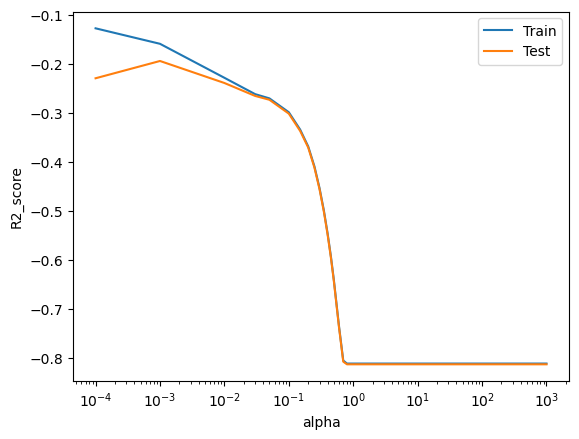

In [152]:
## Plotting R2 score vs alpha values
plt.plot(lassoCV_results['param_alpha'], lassoCV_results['mean_train_score'], label='Train')
plt.plot(lassoCV_results['param_alpha'], lassoCV_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

 As the value of alpha increases, we see a decrease in both train and test error.

##### <p style="background-color:skyblue;"> Comparing Ridge and Lasso regression models</p>

In [153]:
metrics_table = {"Metric": ["R2 Score for 'Train' dataset","R2 Score for 'Test' dataset","RSS for 'Train' dataset",
                            "RSS for 'Test' dataset","MSE for 'Train' dataset","MSE for 'Test' dataset",
                            "RMSE for 'Train' dataset", "RMSE for 'Test' dataset"],
            "Ridge Regression" : ridge_metrics,
            "Lasso Regression" : lasso_metrics
        }

final_metric = pd.DataFrame(metrics_table, columns = ["Metric", "Ridge Regression", "Lasso Regression"] )
final_metric.set_index('Metric')

,Ridge Regression,Lasso Regression
Metric,,
R2 Score for 'Train' dataset,0.94,0.95
R2 Score for 'Test' dataset,0.93,0.88
RSS for 'Train' dataset,59.25,48.94
RSS for 'Test' dataset,33.03,51.60
MSE for 'Train' dataset,0.06,0.05
MSE for 'Test' dataset,0.08,0.12
RMSE for 'Train' dataset,0.24,0.22
RMSE for 'Test' dataset,0.27,0.34


In [154]:
betas = pd.DataFrame(index=X.columns)
betas.rows = X.columns
betas

""
LotFrontage
LotArea
YearRemodAdd
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
1stFlrSF
2ndFlrSF


In [155]:
## Now fill in the values of betas, one column for ridge coefficients and one for lasso coefficients
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [156]:
betas 

,Ridge,Lasso
LotFrontage,0.02,0.01
LotArea,0.05,0.06
YearRemodAdd,0.07,0.08
MasVnrArea,-0.01,0.01
BsmtFinSF1,0.02,0.03
BsmtFinSF2,-0.00,-0.00
BsmtUnfSF,-0.06,-0.04
TotalBsmtSF,0.15,0.18
1stFlrSF,0.04,0.01
2ndFlrSF,0.09,0.07


In [157]:
# Check features removed by Lasso regression
betas[betas['Lasso']==0]

,Ridge,Lasso
LowQualFinSF,0.00,0.00
BedroomAbvGr,0.02,0.00
3SsnPorch,0.00,0.00
PoolArea,0.00,0.00
MSSubClass_40,0.01,-0.00
MSSubClass_45,0.00,0.00
MSSubClass_50,-0.01,-0.00
MSSubClass_75,0.06,0.00
MSSubClass_80,-0.01,0.00
MSSubClass_85,0.03,0.00


In [158]:
# Number of features removed by Lasso regression
betas[betas['Lasso']==0].shape

(243, 2)

In [159]:
# Check features features selected by Lasso regression
betas.loc[betas['Lasso']!=0, 'Lasso']

LotFrontage              0.01
LotArea                  0.06
YearRemodAdd             0.08
MasVnrArea               0.01
BsmtFinSF1               0.03
BsmtFinSF2              -0.00
BsmtUnfSF               -0.04
TotalBsmtSF              0.18
1stFlrSF                 0.01
2ndFlrSF                 0.07
GrLivArea                0.29
BsmtFullBath             0.03
BsmtHalfBath            -0.01
FullBath                 0.04
HalfBath                 0.03
KitchenAbvGr            -0.07
TotRmsAbvGrd             0.01
Fireplaces               0.04
GarageCars               0.04
GarageArea               0.05
WoodDeckSF               0.03
OpenPorchSF              0.02
EnclosedPorch            0.01
ScreenPorch              0.01
MiscVal                  0.00
MoSold                   0.00
AgeOnSelling            -0.18
MSSubClass_30           -0.09
MSSubClass_60           -0.09
MSSubClass_70            0.05
MSSubClass_160          -0.17
MSZoning_FV              0.04
MSZoning_RH              0.03
MSZoning_R

In [160]:
# View the top 10 coefficients of Ridge regression in descending order
betas['Ridge'].sort_values(ascending=False)[:10]

OverallQual_9          0.24
GrLivArea              0.23
OverallCond_9          0.21
Neighborhood_Crawfor   0.21
OverallQual_8          0.20
Functional_Typ         0.19
Exterior1st_BrkFace    0.19
Neighborhood_StoneBr   0.16
TotalBsmtSF            0.15
SaleCondition_Alloca   0.15
Name: Ridge, dtype: float64

In [161]:
# To interpret the ridge coefficients in terms of target, we have to take inverse log (i.e. e to the power) of betas
ridge_coeffs = np.exp(betas['Ridge'])
ridge_coeffs.sort_values(ascending=False)[:10]

OverallQual_9          1.28
GrLivArea              1.26
OverallCond_9          1.23
Neighborhood_Crawfor   1.23
OverallQual_8          1.23
Functional_Typ         1.21
Exterior1st_BrkFace    1.21
Neighborhood_StoneBr   1.18
TotalBsmtSF            1.17
SaleCondition_Alloca   1.16
Name: Ridge, dtype: float64

In [162]:
# View the top 10 coefficients of Lasso in descending order
betas['Lasso'].sort_values(ascending=False)[:10]

OverallQual_9          0.45
OverallCond_9          0.38
OverallQual_8          0.30
Neighborhood_Crawfor   0.30
GrLivArea              0.29
Exterior1st_BrkFace    0.23
Functional_Typ         0.18
TotalBsmtSF            0.18
Neighborhood_Somerst   0.17
GarageYrBlt_2008       0.16
Name: Lasso, dtype: float64

In [163]:
# To interpret the lasso coefficients in terms of target, we have to take inverse log (i.e. 10 to the power) of betas
lasso_coeffs = np.exp(betas['Lasso'])
lasso_coeffs.sort_values(ascending=False)[:10]

OverallQual_9          1.57
OverallCond_9          1.46
OverallQual_8          1.35
Neighborhood_Crawfor   1.35
GrLivArea              1.33
Exterior1st_BrkFace    1.26
Functional_Typ         1.19
TotalBsmtSF            1.19
Neighborhood_Somerst   1.19
GarageYrBlt_2008       1.17
Name: Lasso, dtype: float64

### <font color = green> <strong> Significant variables </strong>
> The variables significant in predicting the price of a house are:-<br>
    1. GrLivArea<br>
    2. OverallQual_9<br>
    3. OverallCond_9<br>
    4. OverallQual_8<br>
    5. Neighborhood_Crawfor<br>
    6. Functional_Typ<br>
    7. Exterior1st_BrkFace<br>
    8. SaleCondition_Alloca<br>
    9. TotalBsmtSF<br>
    10. Neighborhood_Somerst<br>
    11.TotalBsmtSF

### <font color = green> <strong> Inferences </strong>
> 1. GrLivArea: For an increase of 1 unit/square foot of house area, the price will increase by 1.26 to 1.33 times
> 2. OverallQual_9: For the overall material and finish of the house is Very Good or Excellent,
    the price of house will increase by 1.28 to 1.57 times
> 3. OverallQual_8: For the overall material and finish of the house is Very Good or Excellent,
    the price of house will increase by 1.23 to 1.35 times
> 4. Neighborhood_Crawfor: if Crawford is a nearby location, then the price of house will increase by 1.23 to 1.35 
    times
> 5. Functional_Typ: if the home functionality is typical, then the price of house will increase by 1.18 to 1.19 times
> 6. Exterior1st_BrkFace: if the exterior covering on the house is Brick Face, the price of house will increase by 
    1.21 to 1.26 times.

### <font color = green> <strong> LAMBDA values </strong>
> Optimal value of lambda for Ridge Regression = 10<br>
> Optimal value of lambda for Lasso = 0.001

## <font color = orange> <strong> <center> <u> Problem Statement - Part II </u> </center> </strong> </font>

##### <p style="background-color:skyblue;"> Question-1: What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented? </p>

1. Optimal value of alpha for Ridge Regression = 10
2. Optimal value of alpha for Lasso = 0.001

Double the value of alpha for both ridge and lasso i.e., 20 and 0.002

In [164]:
# Building the ridge regression model with double value of alpha i.e. 20
ridge = Ridge(alpha=20)

# Fit the model on training data
ridge.fit(X_train_ridge, y_train_ridge)

# Make predictions
y_train_pred_20 = ridge.predict(X_train_ridge)
y_pred_ridge_20 = ridge.predict(X_test_ridge)

# Check metrics for Alpha=20
ridge_metrics_20 = show_metrics(y_train_ridge, y_train_pred_20, y_test_ridge, y_pred_ridge_20)

R-Squared (Train) = 0.93
R-Squared (Test) = 0.93
RSS (Train) = 65.99
RSS (Test) = 32.54
MSE (Train) = 0.06
MSE (Test) = 0.07
RMSE (Train) = 0.25
RMSE (Test) = 0.27


In [165]:
# Check metrics for Alpha=10
ridge_metrics_10 = show_metrics(y_train_ridge, y_train_pred_ridge, y_test_ridge, y_pred_ridge)

R-Squared (Train) = 0.94
R-Squared (Test) = 0.93
RSS (Train) = 59.25
RSS (Test) = 33.03
MSE (Train) = 0.06
MSE (Test) = 0.08
RMSE (Train) = 0.24
RMSE (Test) = 0.27


In [166]:
# Building Lasso model with double value of alpha i.e. 0.002
lasso = Lasso(alpha=0.002)

# Fit the model on training data
lasso.fit(X_train_lasso, y_train_lasso)

# Make predictions
y_train_pred_lasso_002 = lasso.predict(X_train_lasso)
y_pred_lasso_002 = lasso.predict(X_test_lasso)

# Check metrics with alpha 0.002
lasso_metrics_002 = show_metrics(y_train_lasso, y_train_pred_lasso_002, y_test_lasso, y_pred_lasso_002)

R-Squared (Train) = 0.94
R-Squared (Test) = 0.90
RSS (Train) = 62.08
RSS (Test) = 44.31
MSE (Train) = 0.06
MSE (Test) = 0.10
RMSE (Train) = 0.25
RMSE (Test) = 0.32


In [167]:
# Check metrics with alpha 0.001
lasso_metrics_001 = show_metrics(y_train_lasso, y_train_pred_lasso, y_test_lasso, y_pred_lasso)

R-Squared (Train) = 0.95
R-Squared (Test) = 0.88
RSS (Train) = 48.94
RSS (Test) = 51.60
MSE (Train) = 0.05
MSE (Test) = 0.12
RMSE (Train) = 0.22
RMSE (Test) = 0.34


In [168]:
metrics_table = {"Metric": ["R2 Score for 'Train' dataset","R2 Score for 'Test' dataset","RSS for 'Train' dataset",
                            "RSS for 'Test' dataset","MSE for 'Train' dataset","MSE for 'Test' dataset",
                            "RMSE for 'Train' dataset", "RMSE for 'Test' dataset"],
            "Ridge Regression" : ridge_metrics_20,
            "Lasso Regression" : lasso_metrics_002
        }

final_metric = pd.DataFrame(metrics_table, columns = ["Metric", "Ridge Regression", "Lasso Regression"] )
final_metric.set_index('Metric')

,Ridge Regression,Lasso Regression
Metric,,
R2 Score for 'Train' dataset,0.93,0.94
R2 Score for 'Test' dataset,0.93,0.90
RSS for 'Train' dataset,65.99,62.08
RSS for 'Test' dataset,32.54,44.31
MSE for 'Train' dataset,0.06,0.06
MSE for 'Test' dataset,0.07,0.10
RMSE for 'Train' dataset,0.25,0.25
RMSE for 'Test' dataset,0.27,0.32


In [169]:
betas_x2 = pd.DataFrame(index=X.columns)
betas_x2.rows = X.columns

betas_x2["Ridge"] = ridge.coef_
betas_x2["Lasso"] = lasso.coef_
betas_x2

,Ridge,Lasso
LotFrontage,0.02,0.01
LotArea,0.05,0.05
YearRemodAdd,0.08,0.08
MasVnrArea,-0.00,0.00
BsmtFinSF1,0.04,0.04
BsmtFinSF2,0.00,-0.01
BsmtUnfSF,-0.04,-0.03
TotalBsmtSF,0.14,0.16
1stFlrSF,0.06,0.00
2ndFlrSF,0.10,0.03


In [170]:
betas_x2['Ridge'].sort_values(ascending=False)[:10]

GrLivArea              0.21
OverallQual_9          0.20
OverallQual_8          0.18
Functional_Typ         0.17
Neighborhood_Crawfor   0.17
Exterior1st_BrkFace    0.16
OverallCond_9          0.15
TotalBsmtSF            0.14
OverallCond_7          0.12
Neighborhood_StoneBr   0.12
Name: Ridge, dtype: float64

In [171]:
ridge_coeffs = np.exp(betas_x2['Ridge'])
ridge_coeffs.sort_values(ascending=False)[:10]

GrLivArea              1.24
OverallQual_9          1.22
OverallQual_8          1.20
Functional_Typ         1.19
Neighborhood_Crawfor   1.19
Exterior1st_BrkFace    1.17
OverallCond_9          1.16
TotalBsmtSF            1.15
OverallCond_7          1.13
Neighborhood_StoneBr   1.13
Name: Ridge, dtype: float64

In [172]:
betas_x2['Lasso'].sort_values(ascending=False)[:10]

OverallQual_9          0.49
GrLivArea              0.33
OverallQual_8          0.32
Neighborhood_Crawfor   0.28
OverallCond_9          0.24
Exterior1st_BrkFace    0.20
Functional_Typ         0.18
Neighborhood_Somerst   0.18
TotalBsmtSF            0.16
OverallQual_7          0.14
Name: Lasso, dtype: float64

In [173]:
lasso_coeffs = np.exp(betas_x2['Lasso'])
lasso_coeffs.sort_values(ascending=False)[:10]

OverallQual_9          1.62
GrLivArea              1.39
OverallQual_8          1.38
Neighborhood_Crawfor   1.33
OverallCond_9          1.27
Exterior1st_BrkFace    1.22
Functional_Typ         1.20
Neighborhood_Somerst   1.20
TotalBsmtSF            1.18
OverallQual_7          1.16
Name: Lasso, dtype: float64

Important variables after doubling the alpha are:- <br>
    1. OverallQual_9 <br>
    2. GrLivArea <br>
    3. OverallQual_8 <br>
    4. Neighborhood_Crawfor <br>
    5. OverallCond_9 <br>
    6. Exterior1st_BrkFace <br>
    7. Functional_Typ <br>
    8. TotalBsmtSF <br>
    9. OverallQual_7

##### <p style="background-color:skyblue;"> Question-2: You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why? </p>

Usecase at hand will decide what model we shall choose.<br>
> If there are too many variables and our primary goal involves feature selection, then we will use Lasso.


> If we don't want large coefficients and reduction of coefficient magnitude is one of our prime goals, then we will use Ridge Regression.

##### <p style="background-color:skyblue;"> Question-3: After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now? </p>

In [174]:
top5_var_lasso = ["OverallQual_9", "GrLivArea", "OverallQual_8", "Neighborhood_Crawfor", "OverallCond_9"]

X_train_lasso_dropped = X_train_lasso.drop(top5_var_lasso, axis=1)
X_test_lasso_dropped = X_test_lasso.drop(top5_var_lasso, axis=1)

params = parameters_lasso

lasso = Lasso()

lassoCV_q3 = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)            
lassoCV_q3.fit(X_train_lasso_dropped, y_train_lasso) 

print(lassoCV_q3.best_params_)

Fitting 5 folds for each of 39 candidates, totalling 195 fits
{'alpha': 0.001}


In [175]:
lasso_q3 = Lasso(alpha=0.001)

lasso_q3.fit(X_train_lasso_dropped, y_train_lasso)

y_train_pred_lasso_q3 = lassoCV_q3.predict(X_train_lasso_dropped)
y_pred_lasso_q3 = lassoCV_q3.predict(X_test_lasso_dropped)

lasso_metrics_q3 = show_metrics(y_train_lasso, y_train_pred_lasso_q3, y_test_lasso, y_pred_lasso_q3)

R-Squared (Train) = 0.95
R-Squared (Test) = 0.87
RSS (Train) = 52.29
RSS (Test) = 55.95
MSE (Train) = 0.05
MSE (Test) = 0.13
RMSE (Train) = 0.23
RMSE (Test) = 0.36


In [176]:
metrics_table_q3 = {"Metric": ["R2 Score for 'Train' dataset","R2 Score for 'Test' dataset","RSS for 'Train' dataset",
                            "RSS for 'Test' dataset","MSE for 'Train' dataset","MSE for 'Test' dataset",
                            "RMSE for 'Train' dataset", "RMSE for 'Test' dataset"],
            "Lasso Regression" : lasso_metrics_q3
        }

final_metric_q3 = pd.DataFrame(metrics_table_q3, columns = ["Metric", "Lasso Regression"] )
final_metric_q3.set_index('Metric')

,Lasso Regression
Metric,
R2 Score for 'Train' dataset,0.95
R2 Score for 'Test' dataset,0.87
RSS for 'Train' dataset,52.29
RSS for 'Test' dataset,55.95
MSE for 'Train' dataset,0.05
MSE for 'Test' dataset,0.13
RMSE for 'Train' dataset,0.23
RMSE for 'Test' dataset,0.36


In [177]:
betas_q3 = pd.DataFrame(index=X_train_lasso_dropped.columns)
betas_q3.rows = X_train_lasso_dropped.columns

betas_q3

""
LotFrontage
LotArea
YearRemodAdd
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
1stFlrSF
2ndFlrSF


In [178]:
betas_q3["Lasso"] = lasso_q3.coef_
betas_q3

,Lasso
LotFrontage,0.01
LotArea,0.06
YearRemodAdd,0.09
MasVnrArea,0.01
BsmtFinSF1,0.03
BsmtFinSF2,-0.01
BsmtUnfSF,-0.04
TotalBsmtSF,0.18
1stFlrSF,0.21
2ndFlrSF,0.30


In [179]:
betas_q3["Lasso"].sort_values(ascending=False)[:5]

2ndFlrSF              0.30
Exterior1st_BrkFace   0.24
1stFlrSF              0.21
TotalBsmtSF           0.18
Functional_Typ        0.17
Name: Lasso, dtype: float64

Top 5 predictors now are:- <br>
1. 2ndFlrSF <br>
2. Exterior1st_BrkFace <br>
3. 1stFlrSF <br>
4. TotalBsmtSF <br>
5. Functional_Typ

##### <p style="background-color:skyblue;"> Question-4: How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why? </p>

> Model should should be simpler 

> Robust model is one whose performace is not affected much even when there is variation in the data

> A generalizable model is able to adapt properly to new, previously unseen data, drawn from the same distribution as the one used to create the model.

> To make sure a model is robust and generalizable, we have to take care it doesn't overfit. This is because an overfitting model has very high variance and a smallest change in data affects the model prediction heavily. Such a model will identify all the patterns of a training data, but fail to pick up the patterns in unseen test data.

> In other words, the model should not be too complex in order to be robust and generalizable.

> If we look at it from the prespective of Accuracy, a too complex model will have a very high accuracy. So, to make our model more robust and generalizable, we will have to decrease variance which will lead to some bias. Addition of bias means that accuracy will decrease.

> In general, we have to find strike some balance between model accuracy and complexity. This can be achieved by Regularization techniques like Ridge Regression and Lasso.